# `"PMSM temperature dataset"`
## Problema di regressione

## DESCRIZIONE
Il [dataset](https://www.kaggle.com/wkirgsn/electric-motor-temperature) comprende diverse informazioni raccolte, durante alcuni test condotti su banco di prova, da sensori collegati ad un motore sincrono a magneti permanenti (permanent magnet synchronous motor, PMSM). Il PMSM utilizzato è un nuovo modello prototipale prodotto da una società tedesca e i dati sono stati collezionati dal dipartimento LEA della Paderborn University. **Il dataset è stato anonimizzato.**


I dati sono stati raccolti ad una frequenza di 2 Hz durante diverse sessioni di misurazione per un totale di 140 ore di test sul banco prova. Ogni sessione può essere distinta dal campo `profile_id` e può durare dall'una alle sei ore.

```
The motor is excited by hand-designed driving cycles denoting a reference motor speed and a reference torque. Currents in d/q-coordinates (columns "i_d" and i_q") and voltages in d/q-coordinates (columns "u_d" and "u_q") are a result of a standard control strategy trying to follow the reference speed and torque. Columns "motor_speed" and "torque" are the resulting quantities achieved by that strategy, derived from set currents and voltages.

Most driving cycles denote random walks in the speed-torque-plane in order to imitate real world driving cycles to a more accurate degree than constant excitations and ramp-ups and -downs would.
```



Le variabili più interessanti sono le temperature dello statore (``stator_*``), del rotore (``pm``), e la coppia sprigionata (``torque``). In particolare le ultime due informazioni sono generalmente di difficile ed economicamente onerosa misurazione su veicoli commerciali.

La capacità di stimare con precisione la temperatura del rotore aiuta gli ingegneri a costruire motori robusti ma più leggeri e a massimizzare le performance. Dall'altro lato una corretta stima della coppia espressa dal motore permette di controllare con maggiore precisione il motore, riducendo le perdite di potenza ed eventuali picchi di temperatura.

![PMSM](https://www.embitel.com/wp-content/uploads/2019/05/PMSM-Motor.png)

## Importazione del dataset

In [0]:
import random
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt

%matplotlib inline

In [0]:
df = pd.read_csv('pmsm_temperature.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
ambient           998070 non-null float64
coolant           998070 non-null float64
u_d               998070 non-null float64
u_q               998070 non-null float64
motor_speed       998070 non-null float64
torque            998070 non-null float64
i_d               998070 non-null float64
i_q               998070 non-null float64
pm                998070 non-null float64
stator_yoke       998070 non-null float64
stator_tooth      998070 non-null float64
stator_winding    998070 non-null float64
profile_id        998070 non-null int64
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


**Dizionario**  
> _ambient_: temperatura ambiente misurata da un sensore termico posizionato vicino lo statore  
_coolant_: temperatura del liquido di raffreddamento (acqua) misurata in uscita dal motore  
_u\_d_: voltaggio della componente d   
_u\_q_: voltaggio della componente q  
_motor\_speed_: velocità di rotazione del motore  
_torque_: coppia indotta dalla corrente  
_i\_d_: corrente della componente d  
_i\_q_: corrente della componente q  
_pm_: temperatura superficiale del magnete permanente (permanent magnet) misurata con un'unità termografica ad infrarossi  
_stator\_yoke_: temperatura del giogo dello statore misurata con un sensore termico  
_stator\_tooth_: temperatura dei denti dello statore misurata con un sensore termico  
_stator\_winding_: temperatura dell'avvolgimento dello statore misurata con un sensore termico  
_profile\_id_: ogni sessione di misurazione possiede un unico ID. Ogni sessione è indipendente ed estremamente diversa dalle altre.

**Sulla base delle informazioni fornite, si decide di interpretare come variabili target la temperatura del rotore (`pm`) e la coppia sprigionata (`torque`)**

![PMSM](https://www.embitel.com/wp-content/uploads/2019/05/BLDC-Motor.gif)

In [4]:
df.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [5]:
df.describe()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


**Nessun valore mancante per le covariate disponibili**

## Analisi Sessioni

In [6]:
print(f'For testing the PMSM the team conducted {len(df.profile_id.unique())} sessions.\n')
sessions = df.profile_id.value_counts()
for num, data in zip(sessions.index, sessions.tolist()):
    print(f'Session {int(num):3d}\t\tData collected: {data:6d}\t\tHours of testing: {data/(2*60*60): 2.1f}')

For testing the PMSM the team conducted 52 sessions.

Session  20		Data collected:  43970		Hours of testing:  6.1
Session   6		Data collected:  40387		Hours of testing:  5.6
Session  65		Data collected:  40093		Hours of testing:  5.6
Session  66		Data collected:  36475		Hours of testing:  5.1
Session  27		Data collected:  35360		Hours of testing:  4.9
Session   4		Data collected:  33423		Hours of testing:  4.6
Session  58		Data collected:  33381		Hours of testing:  4.6
Session  56		Data collected:  33122		Hours of testing:  4.6
Session  53		Data collected:  32441		Hours of testing:  4.5
Session  79		Data collected:  31153		Hours of testing:  4.3
Session  44		Data collected:  26340		Hours of testing:  3.7
Session  70		Data collected:  25676		Hours of testing:  3.6
Session  62		Data collected:  25599		Hours of testing:  3.6
Session  30		Data collected:  23862		Hours of testing:  3.3
Session  80		Data collected:  23823		Hours of testing:  3.3
Session  74		Data collected:  23760		Hours of 


---

**Pur mancando un campo esplicativo specifico, dalla documentazione sembra che il dataset riporti ogni rilevazione in ordine cronologico**

> **Verifichiamolo!**

In [7]:
for val in df.profile_id.unique():
    idxs = df.query(f'profile_id == {val}').index
    check = (len(idxs) == (1 + idxs.max() - idxs.min()))
    print(f'Session {val}\t Data available: {len(idxs):6d}\t\tCheck result: {check}')

Session 4	 Data available:  33423		Check result: True
Session 6	 Data available:  40387		Check result: True
Session 10	 Data available:  15255		Check result: True
Session 11	 Data available:   7886		Check result: True
Session 20	 Data available:  43970		Check result: True
Session 27	 Data available:  35360		Check result: True
Session 29	 Data available:  21357		Check result: True
Session 30	 Data available:  23862		Check result: True
Session 31	 Data available:  15586		Check result: True
Session 32	 Data available:  20959		Check result: True
Session 36	 Data available:  22608		Check result: True
Session 41	 Data available:  16699		Check result: True
Session 42	 Data available:  16919		Check result: True
Session 43	 Data available:   8442		Check result: True
Session 44	 Data available:  26340		Check result: True
Session 45	 Data available:  17141		Check result: True
Session 46	 Data available:   2179		Check result: True
Session 47	 Data available:   2175		Check result: True
Session 48	 

**L'ipotesi sembra corretta, costruiamo allora un'altro campo**

In [0]:
idxs_min = []
for val in df.profile_id.unique():
    idxs_min.append(df.query(f'profile_id == {val}').index.min())
    
def inf_closest(x, l):
    return max(l, key=lambda v: v-x if v-x < 0 else np.nan)
    
df['time'] = pd.Series(df.index).apply(lambda x: 0 if x in idxs_min else x - inf_closest(x, idxs_min))

In [9]:
df.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id,time
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4,0
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4,1
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4,2
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4,3
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4,4


## Analisi Univariata e Multivariata

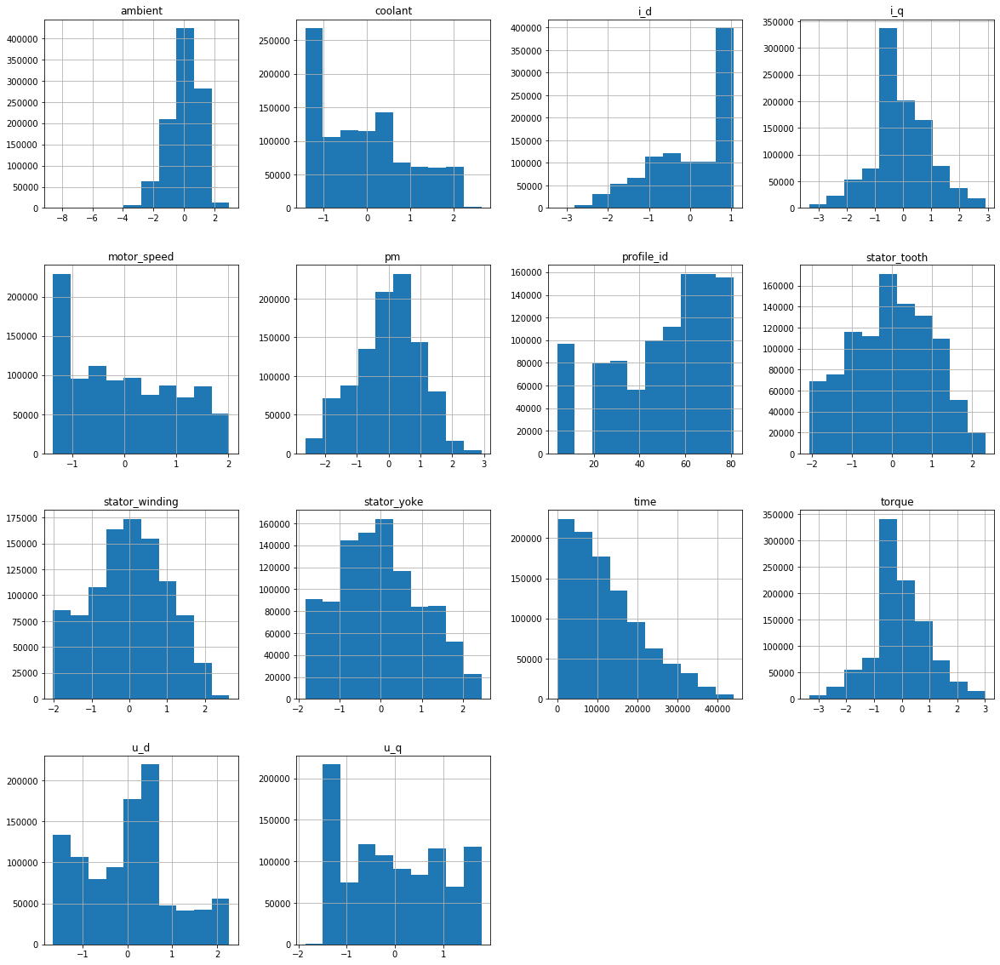

In [10]:
df.hist(figsize = (20,20))
plt.show()

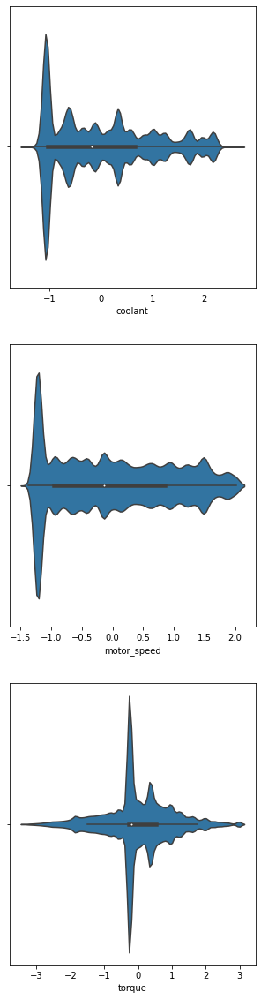

In [11]:
# Violin Plot
column = ['coolant', 'motor_speed', 'torque']
fig, axes = plt.subplots(nrows=3, figsize=(5,20))
fig.subplots_adjust(hspace=0.2)

for (ax, i) in zip(axes, column):
    sns.violinplot(x=df[i], ax=ax)
    plt.plot()

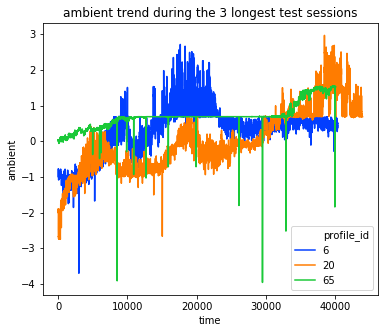

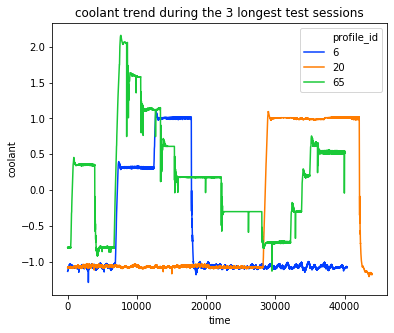

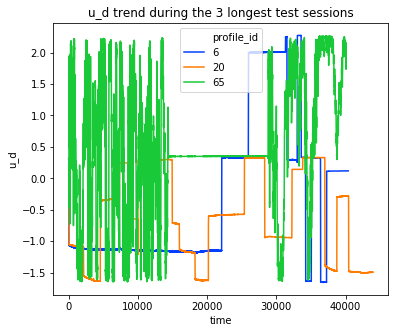

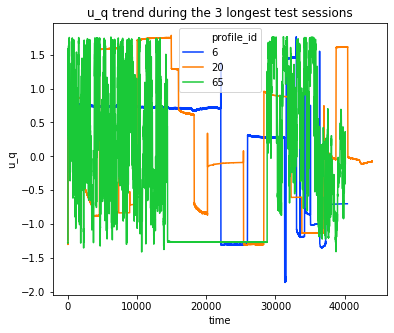

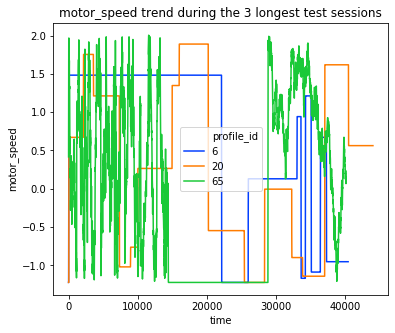

...

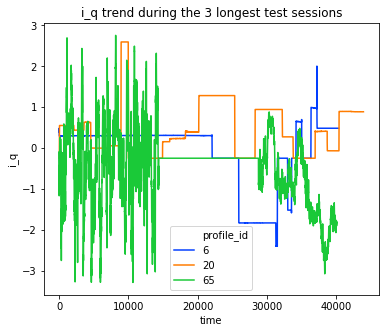

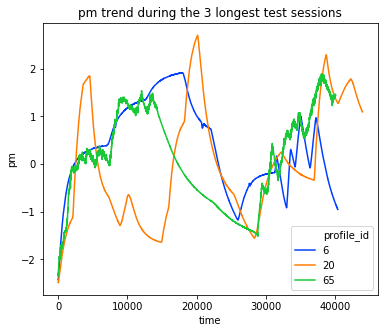

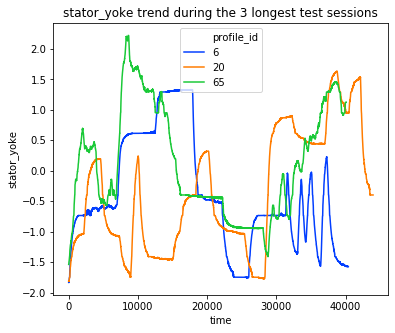

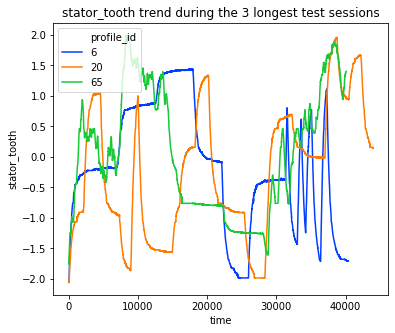

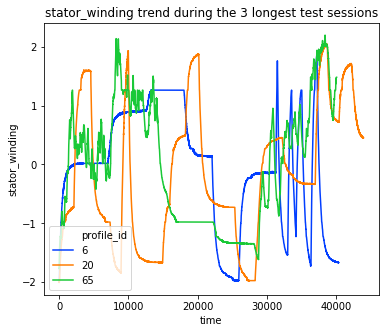

In [12]:
# Analisi temporale delle 3 sessioni più lunghe
columns = df.drop(columns=['profile_id', 'time']).columns

df_plot = df.query('profile_id in [20, 6, 65]')

for col in columns:
    plt.figure(figsize=(6, 5))
    sns.lineplot(x='time', 
                 y=col, 
                 hue='profile_id', 
                 data=df_plot, 
                 palette=sns.color_palette('bright', len(df_plot.profile_id.unique())))
    plt.title(f'{col} trend during the 3 longest test sessions')
    plt.show()

*   **La rilevazione della temperatura ambiente sembra avere picchi anomali**
*   Durante una delle tre sessioni è stata provata una configurazione particolare di alimentazione che probabilmente ha impedito al motore di generare coppia ("il campo `torque` è troppo costante durante questa fase"). Data la nomalizzazione la coppia non risulta avere valore nullo, ma può essere ipotizzato tale anche dal fatto che la temperatura dello statore (`pm`) è sempre calata nell'intervallo di tempo considerato.



### Analisi Temperatura Ambiente

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


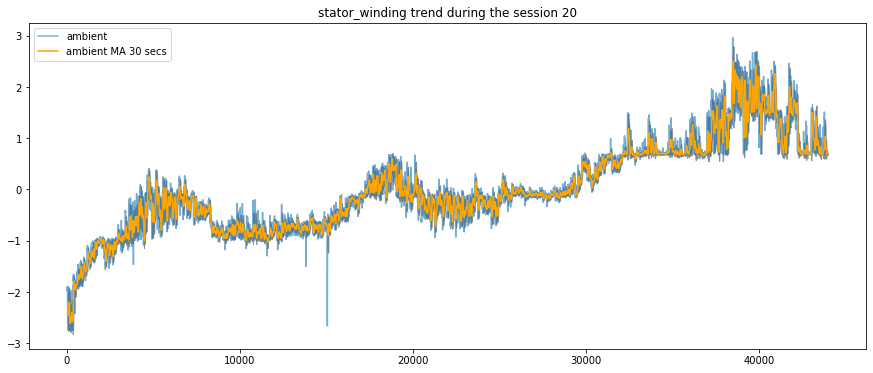

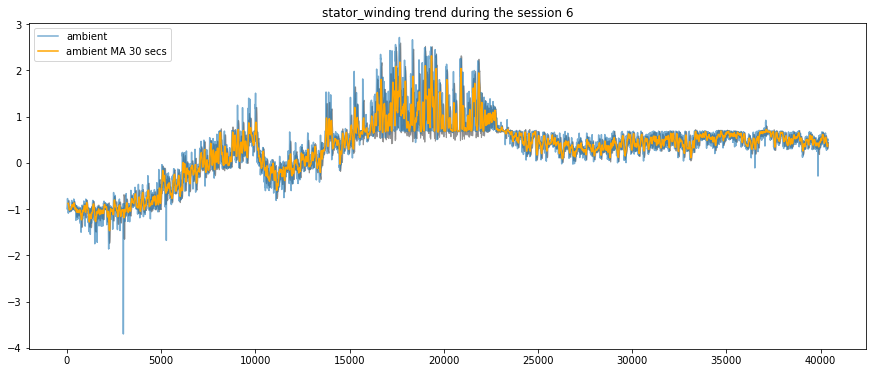

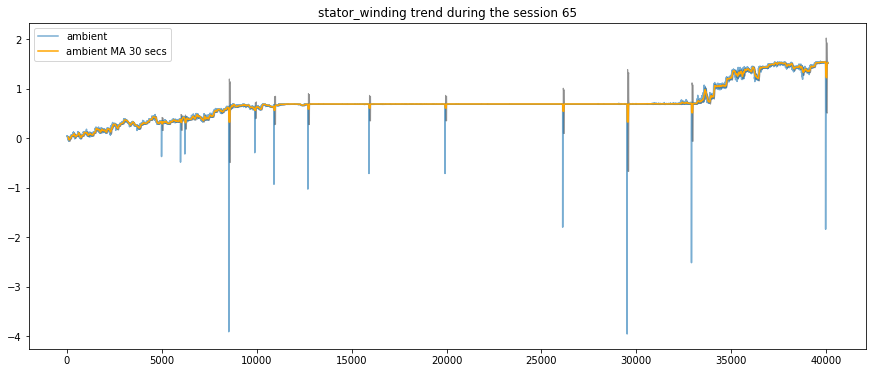

In [13]:
# Try with moving average (MA)
for session in [20, 6, 65]:
    data = df.query(f'profile_id == {session}')
    data['ambient_ma'] = data['ambient'].rolling(window=60).mean()
    data['ambient_std'] = data['ambient'].rolling(window=60).std()
    
    plt.figure(figsize=(15, 6))
    plt.plot(data.time, data.ambient, label='ambient', alpha=0.6)
    plt.plot(data.time, data.ambient_ma, label='ambient MA 30 secs', color='orange')
    plt.fill_between(data.time, data.ambient_ma + data.ambient_std, data.ambient_ma - data.ambient_std, color='grey', alpha=0.8)
    plt.legend(loc='upper left')
    plt.title(f'{col} trend during the session {session}')
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


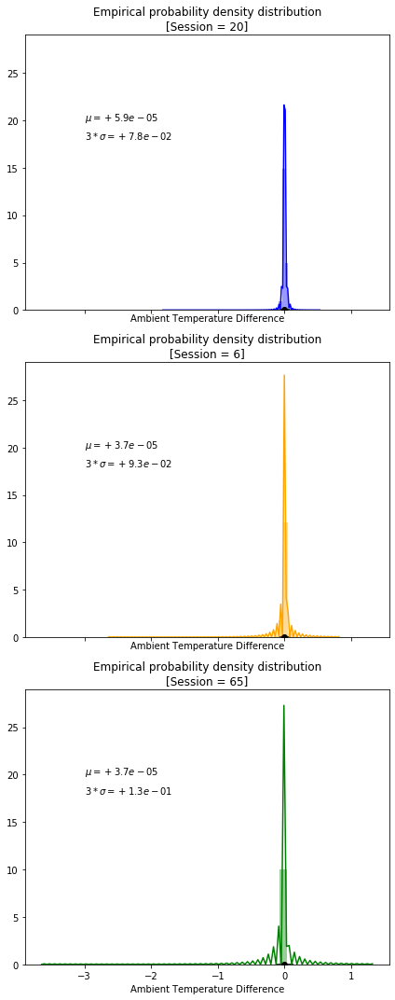

In [14]:
# Try with time difference
fig, ax = plt.subplots(nrows=3, ncols=1, sharex=True, sharey=True, figsize=(6, 15))

# Set the palette
palette=['blue', 'orange', 'green']

for n, session in enumerate([20, 6, 65]):
    data = df.query(f'profile_id == {session}')
    data['ambient_diff'] = data['ambient'].diff()
    ambient_diff_mean = data['ambient_diff'].mean()
    ambient_diff_std = data['ambient_diff'].std()
    
    sns.distplot(data.ambient_diff.dropna(), 
                 rug=False, 
                 color=palette[n],
                 ax=ax[n])

    # Draw standard deviation interval
    ax[n].errorbar(x=ambient_diff_mean, y=0.005, xerr=3.0*ambient_diff_std, fmt='o', color='k')
    ax[n].text(-3, 20, r'$\mu = {:+.1e}$'.format(ambient_diff_mean), fontsize=10)
    ax[n].text(-3, 18, r'$3*\sigma = {:+.1e}$'.format(3.0*ambient_diff_std), fontsize=10)
    
    ax[n].set_title(f'Empirical probability density distribution\n[Session = {session}]')
    ax[n].set_xlabel('Ambient Temperature Difference')

plt.tight_layout()

### Matrice di correlazione

**Correlazione di Pearson**

$$corr(X, Y) = \frac{cov(X, Y)}{\sqrt{var(X) var(Y)}}$$
dove
$$cov(X, Y) = \mathbb{E}[(X-\mathbb{E}[X])(Y-\mathbb{E}[Y])]$$

> Se $X$ e $Y$ sono indipendenti allora $cov(X, Y) = 0$ e $corr(X, Y) = 0$.

Si può dimostrare questa proprietà considerando che due variabili aleatorie si dicono indipendenti quando 
$$\mathbb{E}[XY]=\mathbb{E}[X]\mathbb{E}[Y]$$

*   Il coefficiente di correlazione è simmetrico: $corr(X, Y) = corr(Y, X)$
*   $corr(X, X) = 1$
*   Il coefficiente di correlazione è compreso tra -1 e 1; per tali valori si raggiunge rispettivamente il grado massimo di correlazione negativa e positiva
*   Se $|corr(X, Y)|=1$ allora vi è una dipendenza lineare tra $X$ e $Y$

**Per un campione**
$$r_{XY}=\frac{\sum_{i=1}^{N} (x_i - \bar{x})(y_i - \bar{y})}{\sqrt{\sum_{i=1}^{N} (x_i - \bar{x})^2}\sqrt{\sum_{i=1}^{N} (y_i - \bar{y})^2}}$$

Una interpretazione grafica: [Wikipedia](https://en.wikipedia.org/wiki/Pearson_correlation_coefficient#Geometric_interpretation)

**!! Attenzione a non confondere correlazione con causalità !!**
> `È colpa dei pompieri se ci sono tanti incendi! Più ce n'è in un luogo, più grande è l'incendio che scoppia!`

[Interessante conferenza in merito](https://youtu.be/cDhcmjCa7Pc)

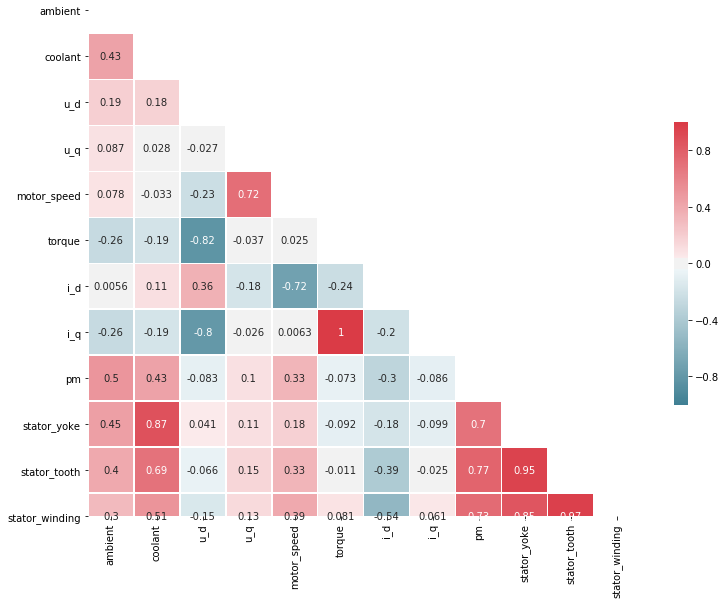

In [15]:
corr = df.drop(columns=['profile_id', 'time']).corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, 
            mask=mask,
            cmap=cmap, 
            vmin=-1, 
            vmax=1, 
            annot=True,
            center=0,
            square=True,
            linewidths=.5, 
            cbar_kws={"shrink": .5})

plt.tight_layout()
plt.show()

#### Correlazione tra `i_q` e `torque`

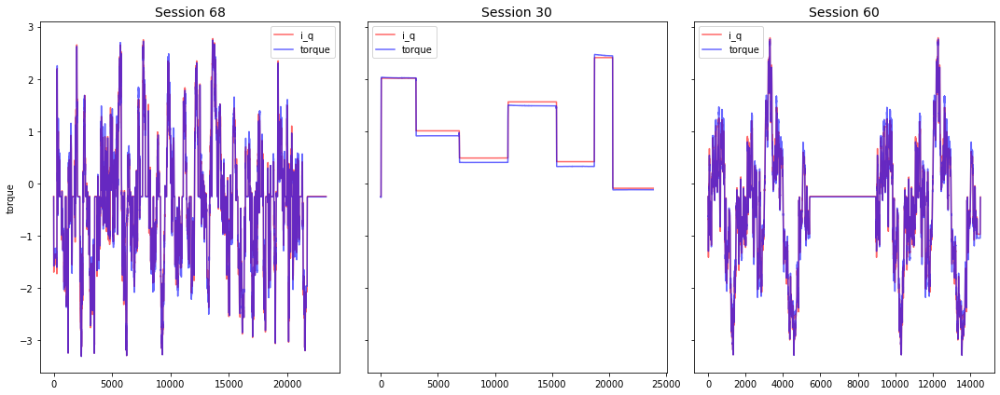

In [16]:
rnd_sessions = random.sample(df.profile_id.unique().tolist(), 3)

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(15, 6))

for i, session in enumerate(rnd_sessions):
    data = df.query(f'profile_id == {session}')

    sns.lineplot(x='time', 
                 y='i_q', 
                 data=data, 
                 color='r', 
                 label='i_q',
                 ax=axs[i],
                 alpha=0.6)
    
    sns.lineplot(x='time', 
                 y='torque', 
                 data=data, 
                 color='b', 
                 label='torque',
                 ax=axs[i],
                 alpha=0.6)
    
    axs[i].set_title(f'Session {session}', fontsize=14)
    axs[i].set_xlabel('')
    
plt.tight_layout()
plt.show()

> **È inutile sviluppare un modello di machine learning per predire la coppia sprigionata!**

**Conviene concentrarsi solo sulla temperatura del rotore**

## Training & Validation

In [0]:
import warnings
warnings.filterwarnings('ignore')

from graphviz import Source
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor, export_graphviz
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, RepeatedKFold

### (1) Feature pre-processing

**I dati sono già stati normalizzati tra -3 e +3**

In [0]:
df.drop(columns=['torque'], inplace=True)

### (2) Partizionamento del dataset & Definizione del perimetro

**Definiamo il dataset che sarà modellizzato**

In [19]:
# Train set / Test set split is not appropriate with a time series
# !! DON'T DO RANDOM SPLITTING !!
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

test_size = 0.3
idx_test = []

for session in tqdm(df.profile_id.unique()):
    idxs = df.query(f'profile_id == {session}').sort_values(by='time').index.tolist()

    # Total index
    tot_idx = len(idxs)

    # Random index
    rnd_idx = random.randrange(0, tot_idx)

    # Test elements
    num_test_idx = int(tot_idx*test_size)

    idx_test += idxs[rnd_idx:min(rnd_idx + num_test_idx, tot_idx)]

    if rnd_idx + num_test_idx > tot_idx:
        idx_test += idxs[0:num_test_idx - len(idx_test)]


# Build train and test sets
X_train = df.drop(columns=['pm', 'profile_id', 'time'], index=idx_test)
y_train = df.drop(index=idx_test)['pm']

X_test = df.drop(columns=['pm', 'profile_id', 'time']).loc[idx_test]
y_test = df.loc[idx_test, 'pm']

100%|██████████| 52/52 [00:00<00:00, 78.88it/s]


In [20]:
print(f'Training set : {len(X_train):10d}')
print(f'Test set     : {len(X_test):10d}')
print(f'Features     : {X_train.columns.tolist()}')

Training set :     724371
Test set     :     273699
Features     : ['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'i_d', 'i_q', 'stator_yoke', 'stator_tooth', 'stator_winding']


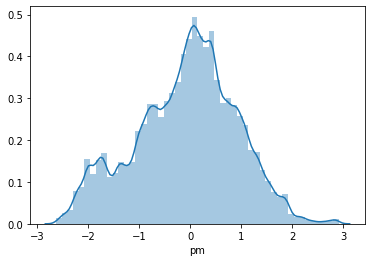

In [21]:
sns.distplot(y_train, rug=False)
plt.show()

### (3) Definizione delle metriche di interesse

> **Scarto quadratico medio** (MSE)
$$MSE = \frac{1}{N}\sum_{i=1}^{N}(y_i-\hat{y}_i)^2$$

> **Scarto medio assoluto** (MAE)
$$MAE = \frac{1}{N}\sum_{i=1}^{N}|y_i-\hat{y}_i|$$

> **Scarto quadratico medio logaritmico** (MSLE)
$$MSLE = \frac{1}{N}\sum_{i=1}^{N}\left(\log(1 + y_i) -\log(1+\hat{y}_i\right)^2$$
$$MSLE = \frac{1}{N}\sum_{i=1}^{N}\left[\log\left(\frac{1 + y_i}{1+\hat{y}_i}\right)\right]^2$$

> **Scarto percentuale assoluto medio** (MAPE)
$$MAPE = \frac{1}{N}\sum_{i=1}^{N}\frac{|y_i-\hat{y}_i|}{y_i}$$

---

> **Coefficiente di determinazione** ($R^2$)
$$R^2 = 1 - \frac{\sum_{i=1}^{N}(y_i-\hat{y}_i)^2}{\sum_{i=1}^{N}(y_i-\bar{y}_i)^2}$$

> **Explained Variance** ($\text{ex_Var}$)
$$\text{ex_Var} = 1 - \frac{var(y-\hat{y})}{var(y)}$$
$$\text{ex_Var} = 1 - \frac{\sum_{i=1}^{N} \left(r_i^2 - \bar{r_i}\right)}{\sum_{i=1}^{N} \left(y_i^2-\bar{y}_i\right)}$$
con $r_i = y_i-\hat{y}_i$


In [0]:
def reg_report(model, X_test, y_test):
    y_pred = model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    print('REGRESSION REPORT')
    print(f'MSE  : {mse:.4f}')
    print(f'RMSE : {np.sqrt(mse):.4f}')
    print(f'MAE  : {mean_absolute_error(y_test, y_pred):.4f}')
    print(f'R2   : {r2_score(y_test, y_pred):.2%}')
    print(f'explained_variance: {explained_variance_score(y_test, y_pred):.4f}')

### (4) Dummy Model
Prima di sviluppare algoritmi complessi è buona pratica sviluppare algoritmi estremamente banali così da poter disporre di un benchmark per le successive migliorie

In [23]:
strategy = 'mean'
dummy_model = DummyRegressor(strategy=strategy)

dummy_model.fit(X_train, y_train)
reg_report(dummy_model, X_test, y_test)

REGRESSION REPORT
MSE  : 1.0263
RMSE : 1.0131
MAE  : 0.8354
R2   : -9.10%
explained_variance: 0.0000


### Tecniche "avanzate" di validazione

> Esistono diverse tecniche avanzate di validazione tra qui la **k-fold cross validation** e sue varianti.\
[Qui](https://scikit-learn.org/stable/modules/cross_validation.html#cross-validation-iterators) per maggiori dettagli.

![Kfold](https://www.researchgate.net/profile/Fabian_Pedregosa/publication/278826818/figure/fig10/AS:614336141750297@1523480558954/The-technique-of-KFold-cross-validation-illustrated-here-for-the-case-K-4-involves.png)


In [0]:
def cross_valid_report(model, X, y, model_type):  
    # Evaluate scores from CV
    scores = cross_val_score(model, 
                             X, 
                             y, 
                             scoring='neg_mean_squared_error',
                             cv=RepeatedKFold(n_splits=5, n_repeats=5))
    # This leads to MSE scores
    scores *= -1
    
    cross_valid_type = 'RepeatedKFold'
        
    plt.figure(figsize=(7, 5))
    
    hist, bins, bars = plt.hist(scores, bins='auto', align='left')
    plt.grid(axis='y', alpha=0.75)
    
    # Fix bar alignment
    plt.xticks(bins[:-1])
    
    plt.axvline(x=scores.mean(), color='k', linestyle='--', linewidth=1)
    plt.errorbar(x=scores.mean(), y=0.8, xerr=scores.std(), fmt='o', color='k')
    
    plt.suptitle(f'{cross_valid_type} ({len(scores)} folds) with {model_type}', fontsize=16)
    plt.title(f'Scores (MSE) mean={scores.mean():.3f} +/- {scores.std():.3f} (1 s.d.)', fontsize=14)
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()
    
    return scores

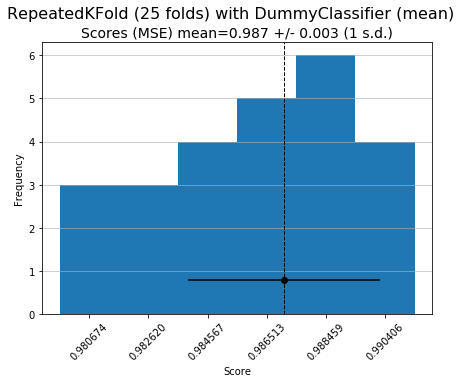

In [25]:
# Verify model stability
# for the dummy model
scores = {}
scores['dummy'] = cross_valid_report(dummy_model, X_train, y_train, model_type=f'DummyClassifier ({strategy})');

**Per l'ottimizzazione degli iper-parametri**

In [0]:
def search_cv_report(model):
    print(f'Best model parameters: {model.best_params_}\n')
    print('K-Fold Validation')
    print('\tmean_test_score : {:6.2%}'.format(model.cv_results_['mean_test_score'][model.best_index_]))
    print('\tstd_test_score  : {:6.2%}'.format(model.cv_results_['std_test_score'][model.best_index_]))

## Elastic Net

> **Regolarizzazione**: [Ridge, Lasso, Elastic](https://en.wikipedia.org/wiki/Lasso_(statistics)#Geometric_interpretation)

![L1 L2 Regularization](https://i.stack.imgur.com/A9yFq.png)

### (5) Model Training [Elastic Net]

You can also use [ElasticNetCV](https://scikit-learn.org/0.15/modules/generated/sklearn.linear_model.ElasticNetCV.html).

In [0]:
elastic_net = ElasticNet()

hyperparameters = {'alpha': np.linspace(0., 10., num=10),
                   'l1_ratio': np.linspace(0., 1., num=5)}

random_search = RandomizedSearchCV(elastic_net,
                                   hyperparameters, 
                                   n_iter=10,
                                   cv=5,
                                   refit=True,
                                   n_jobs=-1,
                                   verbose=1)

In [28]:
%%time
# Train and store the best model
elastic_model = random_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.4min finished


CPU times: user 36.6 s, sys: 1.05 s, total: 37.6 s
Wall time: 1min 41s


### (6) Model Validation [Elastic Net]

**Yellow Brick**: una libreria per lo studio dei risultati di un classificatore o regressore

In [0]:
#from yellowbrick.regressor import PredictionError, ResidualsPlot

In [30]:
# Validate performance
search_cv_report(elastic_model)

Best model parameters: {'l1_ratio': 0.0, 'alpha': 0.0}

K-Fold Validation
	mean_test_score : 69.37%
	std_test_score  :  9.86%


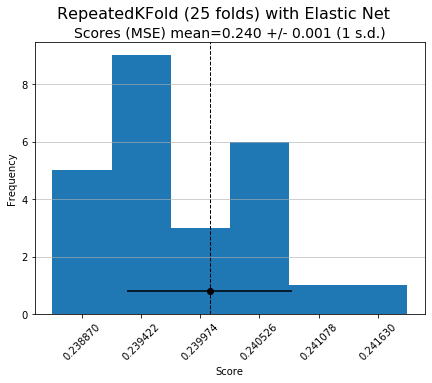

In [31]:
# Verify model stability
scores['elastic_net'] = cross_valid_report(elastic_model.best_estimator_, X_train, y_train, model_type='Elastic Net');

In [32]:
# Test
print(f'Test R2 Score: {elastic_model.score(X_test, y_test):.1%}')

Test R2 Score: 79.0%


In [33]:
reg_report(elastic_model, X_test, y_test)

REGRESSION REPORT
MSE  : 0.1977
RMSE : 0.4446
MAE  : 0.3355
R2   : 78.98%
explained_variance: 0.7952


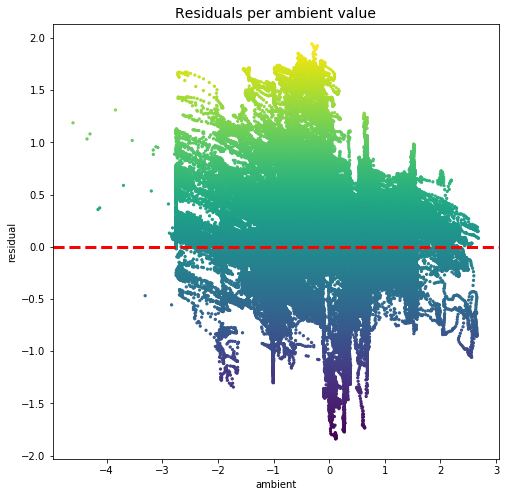

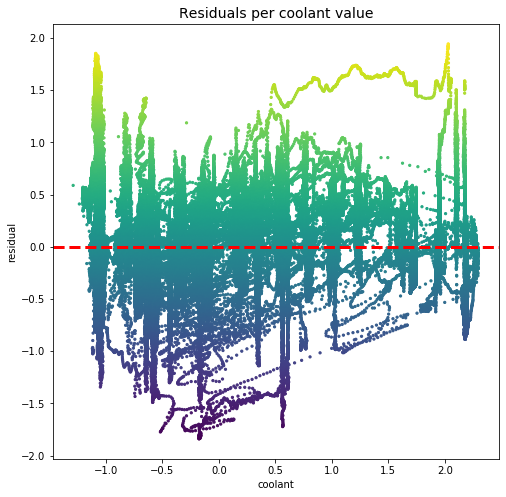

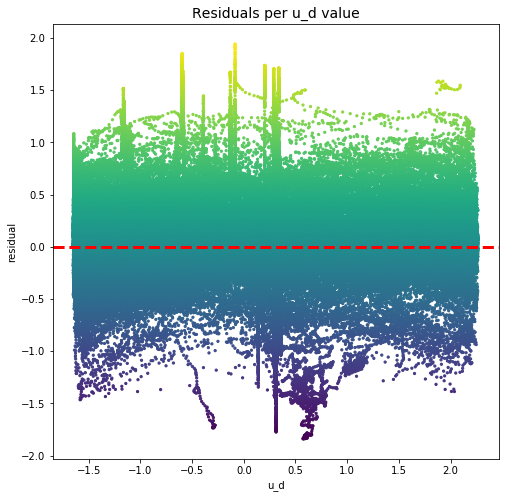

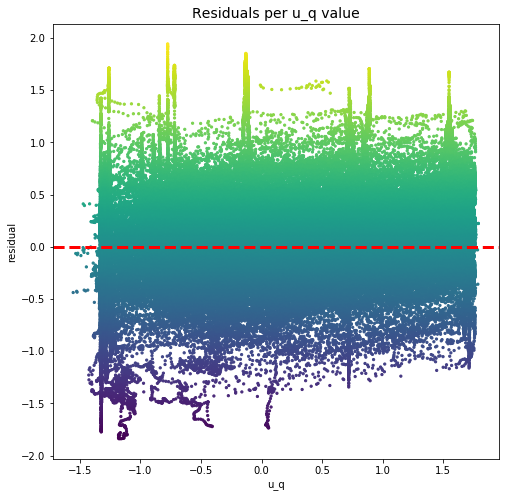

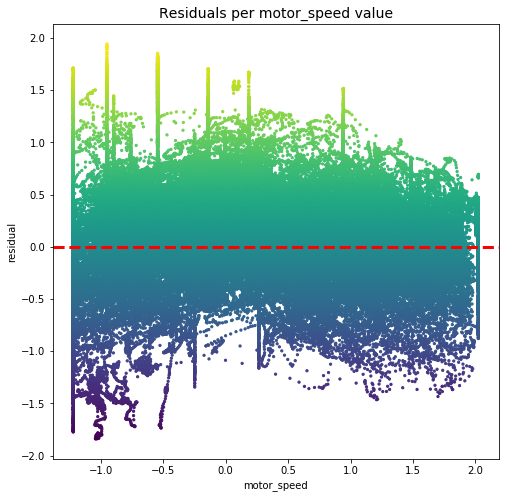

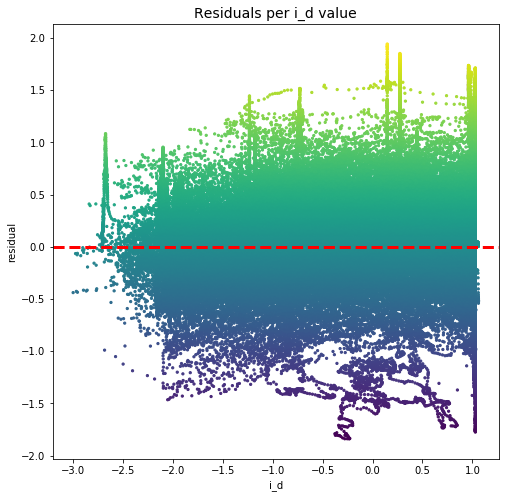

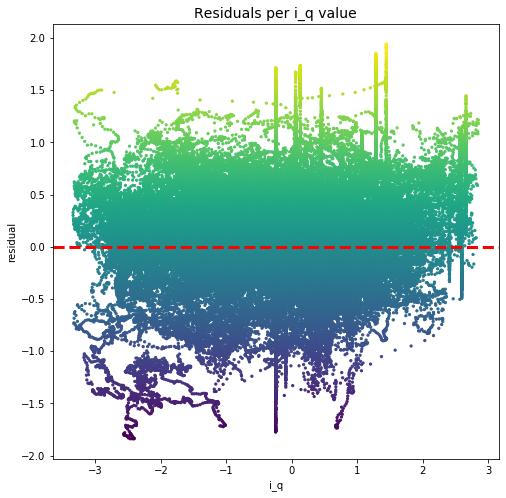

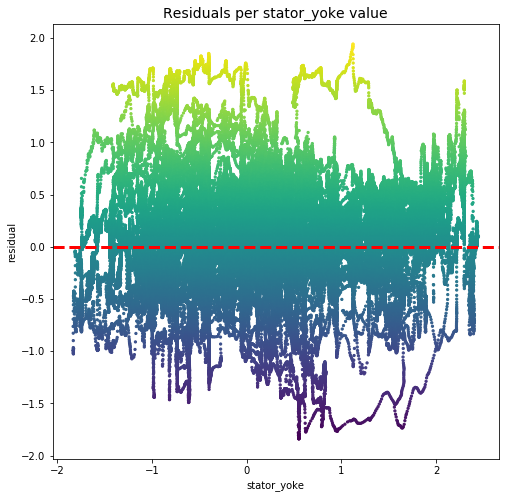

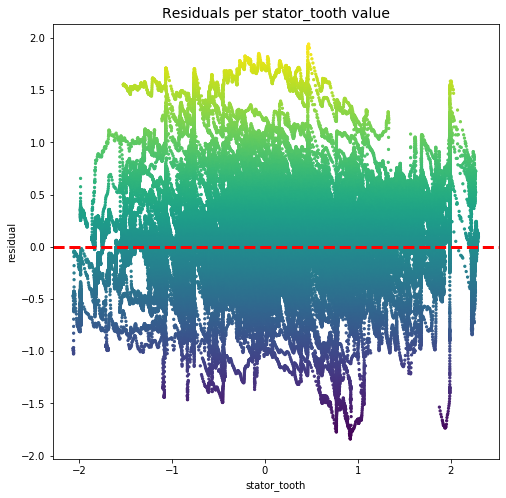

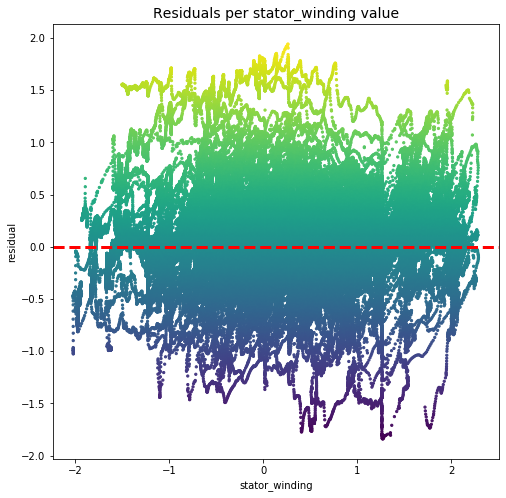

In [34]:
y_pred = elastic_model.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### (7) Worst Predictions Analysis [Elastic Net]

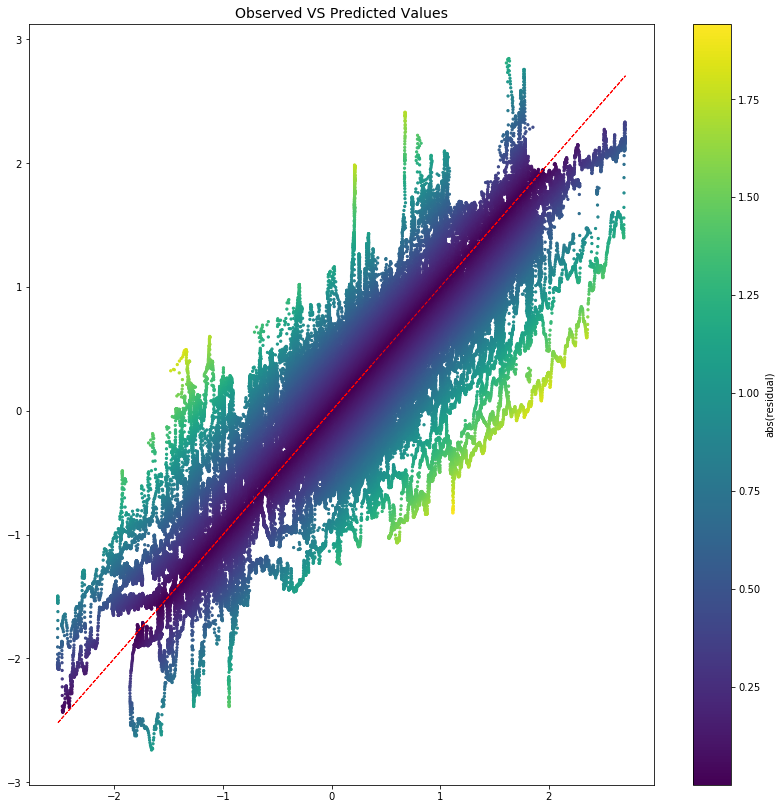

In [35]:
#Identify worsts predictions
def get_worst_pred(model, X, y):
    y_pred = model.predict(X)
    data = pd.DataFrame({'y_pred': y_pred}, index=X.index)
    data['y_truth'] = y
    data['abs_residual'] = (data.y_truth - data.y_pred).abs()

    data.sort_values(by=['abs_residual'], ascending=False, inplace=True)
    
    plt.figure(figsize=(14, 14))    
    plt.scatter(x=data.y_truth, y=data.y_pred, c=data.abs_residual, marker='o', s=5, cmap='viridis')
    plt.plot(data.y_truth, data.y_truth, c='r', ls='--', lw=1)
    clb = plt.colorbar()
    clb.set_label('abs(residual)')
    plt.title('Observed VS Predicted Values', fontsize=14)
    plt.show()
    
    return data

df_worst_pred = get_worst_pred(elastic_model, X_test, y_test)

In [36]:
df_worst_pred.head(10)

,y_pred,y_truth,abs_residual
285620,-0.825756,1.116430,1.942185
285619,-0.822264,1.116519,1.938783
285617,-0.807747,1.116466,1.924213
285616,-0.805234,1.116237,1.921471
285618,-0.804070,1.116640,1.920710
285615,-0.799132,1.118806,1.917938
285614,-0.789225,1.118610,1.907835
285621,-0.787950,1.116151,1.904101
285613,-0.774325,1.119058,1.893383
285612,-0.769678,1.119721,1.889399


**Check features for worst predicted points**

In [37]:
# Given the filter above (for 1 or 0 errors), show the worst offenders
index_to_debug = df_worst_pred.index
points_to_debug = X_test.loc[index_to_debug].head(10)
points_to_debug.style.background_gradient(cmap='summer', low=2).set_caption('For worsts errors, show the features we use')

,ambient,coolant,u_d,u_q,motor_speed,i_d,i_q,stator_yoke,stator_tooth,stator_winding
285620,-0.311157,2.03083,-0.0842163,-0.775457,-0.951858,0.147506,1.44294,1.12355,0.47093,0.263527
285619,-0.30638,2.03035,-0.0844986,-0.775567,-0.951889,0.147575,1.44296,1.12313,0.470322,0.261501
285617,-0.211019,2.02922,-0.0843785,-0.775607,-0.951872,0.147508,1.44295,1.12207,0.46416,0.254729
285616,-0.213388,2.02899,-0.0843291,-0.775611,-0.9519,0.147587,1.44296,1.12122,0.461858,0.249222
285618,-0.276333,2.02982,-0.0844063,-0.775559,-0.951896,0.147618,1.44295,1.1228,0.471653,0.258674
285615,-0.216692,2.02867,-0.0843319,-0.775617,-0.951892,0.147619,1.44295,1.11989,0.461858,0.246406
285614,-0.226973,2.02803,-0.0842867,-0.775591,-0.951864,0.147496,1.44294,1.11867,0.461858,0.240785
285621,-0.271937,2.03114,-0.0842492,-0.775431,-0.951894,0.147621,1.44295,1.12366,0.479383,0.264978
285613,-0.235652,2.02747,-0.0844132,-0.775595,-0.951896,0.147584,1.44296,1.11717,0.461857,0.232939
285612,-0.247765,2.0267,-0.0843018,-0.775555,-0.95189,0.147612,1.44295,1.11508,0.461857,0.230242


**Example of debugging**

In [38]:
# Example of debugging
point_to_debug = X_test.loc[index_to_debug[0]]
print('Debugging:', point_to_debug, 
      'with scores:', df_worst_pred.loc[point_to_debug.name], 
      sep='\n\n')

Debugging:

ambient          -0.311157
coolant           2.030829
u_d              -0.084216
u_q              -0.775457
motor_speed      -0.951858
i_d               0.147506
i_q               1.442943
stator_yoke       1.123553
stator_tooth      0.470930
stator_winding    0.263527
Name: 285620, dtype: float64

with scores:

y_pred         -0.825756
y_truth         1.116430
abs_residual    1.942185
Name: 285620, dtype: float64


### (8) Model vs Dummy Classifier [Elastic Net]

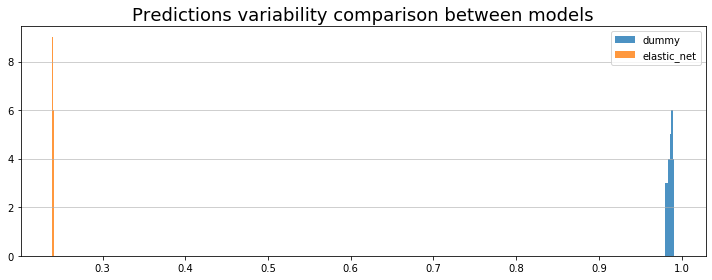

In [39]:
df_scores = pd.DataFrame(scores)


# Plot scores for every model
plt.figure(figsize=(10, 4))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

## Regression Tree

**Classification And Regression Trees (CART)**

L'idea è di partizionare lo spazio delle covariate in modo tale ad ogni regione individuata possa essere assegnato un semplice modello. I CART possono essere visti come una combinazione di molti modelli in cui, ad un determinato punto $\mathbf{x}\in\mathcal{X}$, soltanto uno di essi è responsabile dell'effettiva previsione.

Il processo per cui si sceglie quale modello utilizzare per fornire la previsione in quel dato punto può essere descritta come un *processo decisionale sequenziale*. I CART sono un esempio di questa metodologia, ma ne esistiono anche altre come ID3 o C4.5.

I CART si basano su un processo ricorsivo in cui ad ogni step lo spazio delle variabili esplicative $\mathcal{X}$ è separato in due regioni i cui spigoli sono allineati con gli assi: ciò significa che una delle covariate è utilizzata come discriminante per distinguere le due porzioni di $\mathcal{X}$. Ad esempio si seleziona $t$, valore di una covariata $x_i$ tale che
$$\mathcal{X} = \{x_i < t\} \cap \{x_i \ge t\} = \mathcal{X}_1 \cap \mathcal{X}_2$$
poi, con $s$ valore di $x_j$,
$$\mathcal{X} = \mathcal{X}_1 \cup (\mathcal{X}_2 \cap \{x_j < s\}) \cup (\mathcal{X}_2 \cap \{x_j \ge s\})$$
e così via.

All'interno di ogni regione individuata costruiamo un modello distinto per la variabile target.
Ad esempio, nel caso più semplice, in un compito di regressione prevediamo un valore costante; per un compito di classificazione associamo alla regione una specifica probabilità per una data classe. Questo è esattamente ciò che accade nelle **foglie** dei CART.


Questa interpretazione vale anche per i livelli superiori dell'albero decisionale, in cui si può affermare che per una data regione di $\mathcal{X}$ il modello predittivo utilizzato è un altro CART.

Un'importante proprietà dei CART è che sono facilmente interpretabili in quanto per una persona sono equivalenti ad un processo decisionale.

**Questo tipo di decision trees non sono graphical models**

![Regression Tree](https://gdcoder.com/content/images/2019/05/Screen-Shot-2019-05-17-at-00.09.26.png)

**Training**

Allenare un modello CART significa determinare la struttura dell'albero, incluse quali variabili esplicative utilizzare ad ogni **nodo** e quali valori di essa scegliere per costruire il criterio di separazione (*split criterion*). Risulta inoltre necessario associare ad ogni regione dello spazio delle covariate il rispettivo valore della variabile target previsto.

Per definire una regola che guidi la definizione dei criteri di separazione occorre definire una *risk function*.
Nel caso di regression tree si usa generalmente lo scarto quadratico medio (MSE) o una misura della deviazione standard: per problemi di classificazione nella pratica si usa o l'indice di Gini o l'entropia (che è equivalente a quanto si ottiene applicando la stima tramite massima verosimiglianza, vedi reg. logistica).

Analizziamo il caso di un albero di regressione con training set $\mathcal{D}=\left\{(\mathbf{x}_i, y_i) \right\}_{i=1,\dots, N}$ e $\mathbf{x_i} = (x_1, \dots, x_d)$. Se il partizionamento dello spazio delle covariate fosse noto, potremmo minimizzare la *funzione di rischio* (assunta come MSE) su $\mathcal{D}$, per la specifica regione, semplicemente prendendo la media delle osservazioni di $Y$ sui punti che ricadono in quella regione dello spazio.

Sia $\mathcal{R}$ una regione di $\mathcal{X}$, allora
$$\hat{y}_{\mathcal{R}} = \frac{1}{N_\mathcal{R}} \sum_{\mathbf{x}_i \in \mathcal{R}} y_i$$

Per determinare la struttura dell'albero, e quindi le regioni di $\mathcal{X}$, supponiamo di fissare il numero di nodi. Risulterebbe computazionalmente troppo oneroso provare contemporaneamente qualsiasi combinazione possibile di covariata-valore per ogni nodo, valutando poi l'albero migliore. Per questo motivo si utilizza una tecnica di **greedy optimization** in cui si costruisce l'albero a partire da un unico nodo, si individua un criterio di separazione, e si procede poi aggiungendo nodi ai rami appena prodotti facendo crescere l'albero.
Ad ogni step si possono individuare diversi criteri di separazione, dipendenti sia dalla variabile esplicativa scelta che dal treshold. Per ogni criterio lo spazio delle variabili esplicative è ulteriormente frammentato e per le due regioni di $\mathcal{X}$ così ottenute si determinano le previsioni. Esistono algortmi che provano ogni combinazione possibile per quel nodo, o altri che svolgono ricerche "semplificate" (al costo dell'aggiunta di nuovi iper-parametri). Lo split criterion scelto è quello che garantisce la maggiore diminuzione della risk function: la maggiore differenza tra il MSE prima del nodo e quello derivante dalla somma delle sue foglie. Tale differenza viene detta anche **cost of split**.

La costruzione/profondità dell'albero può continuare finché ogni regione di $\mathcal{X}$ contiene un solo datapoint, cioé fino a che l'albero ha foglie che "contengono" un solo punto.

La capacità dei CART di raggiungere una simile granularità porta però al rischio di overfitting. Per questo motivo si applica la tecnica del **pruning** (potatura) delle foglie. Essa consiste nel fermare il processo di eliminazione delle foglie e dei nodi che raggiungono una profondità troppo elevata. Diversi possono essere i criteri di pruning, si può basare sul numero massimo di nodi, sul numero minimo di punti per regione di $\mathcal{X}$ e così via.

Sia $T$ una foglia che si riferisce a $\mathcal{R}_k$ regione di $\mathcal{X}$ e $|T|$ il suo nodo (la "profondità"). La risk function in $T$ vale
$$Q_{\mathcal{R}_k}(T) = \sum_{\mathbf{x}_i \in \mathcal{R}_k} \left(y_i - \hat{y}_{\mathcal{R}_k}\right)^2$$
dove per evitare ambiguità è stata cambiata la notazione. Il criterio di pruning si può scrivere allora come
$$C(T) = \sum_{k=0}^{|T|} Q_{\mathcal{R}_k}(T) + \lambda |T|$$

**Per come sono costruiti i CART, la restrizione più forte è che i criteri di separazione si basano su partizioni allineate a uno degli assi di $\mathcal{X}$.**

Queste condizioni possono essere rilassate a spese dell'interpretabilità dei modelli, ad esempio permettendo che lo split sia funzione di più varaibili esplicative combinate tra loro.

![CART predictions](https://cambridgecoding.files.wordpress.com/2016/01/regtree2.png?w=1165)

Da Wikipedia:

**Advantages of CART**

* Simple to understand, interpret, visualize.
* Decision trees implicitly perform variable screening or feature selection.
* Can handle both numerical and categorical data. Can also handle multi-output problems.
* Decision trees require relatively little effort from users for data preparation.
* Nonlinear relationships between parameters do not affect tree performance.

**Disadvantages of CART**

* Decision-tree learners can create over-complex trees that do not generalize the data well. This is called overfitting.
* Decision trees can be unstable because small variations in the data might result in a completely different tree being generated. This is called variance, which needs to be lowered by methods like bagging and boosting.
* Greedy algorithms cannot guarantee to return the globally optimal decision tree. This can be mitigated by training multiple trees, where the features and samples are randomly sampled with replacement.
* Decision tree learners create biased trees if some classes dominate. It is therefore recommended to balance the data set prior to fitting with the decision tree.

### (5) Model Training [Regression Tree]

In [0]:
reg_tree = DecisionTreeRegressor()

hyperparameters = {'max_depth': np.arange(1., 31.),
                   'min_samples_split': np.linspace(5, 15, num=3).astype('int'),
                   'min_samples_leaf': np.linspace(5, 15, num=3).astype('int')}

random_search = RandomizedSearchCV(reg_tree,
                                   hyperparameters, 
                                   n_iter=10,
                                   cv=5,
                                   refit=True,
                                   n_jobs=-1,
                                   verbose=1)

In [41]:
%%time
# Train and store the best model
tree_model = random_search.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.7min finished


CPU times: user 8.92 s, sys: 246 ms, total: 9.17 s
Wall time: 4min 50s


### (6) Model Validation [Regression Tree]

**Yellow Brick**: una libreria per lo studio dei risultati di un classificatore o regressore

In [0]:
#from yellowbrick.regressor import PredictionError, ResidualsPlot

In [43]:
# Validate performance
search_cv_report(tree_model)

Best model parameters: {'min_samples_split': 15, 'min_samples_leaf': 15, 'max_depth': 9.0}

K-Fold Validation
	mean_test_score : 44.42%
	std_test_score  : 14.67%


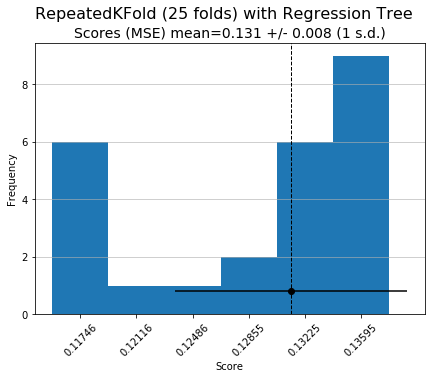

In [44]:
# Verify model stability
scores['reg_tree'] = cross_valid_report(tree_model.best_estimator_, X_train, y_train, model_type='Regression Tree');

In [45]:
# Test
print(f'Test R2 Score: {tree_model.score(X_test, y_test):.1%}')

Test R2 Score: 70.6%


In [46]:
reg_report(tree_model, X_test, y_test)

REGRESSION REPORT
MSE  : 0.2761
RMSE : 0.5255
MAE  : 0.3963
R2   : 70.65%
explained_variance: 0.7117


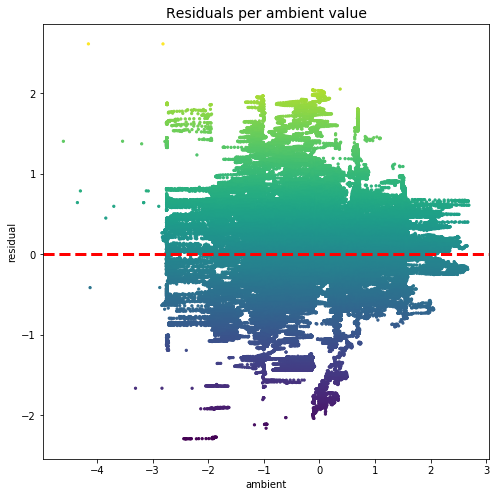

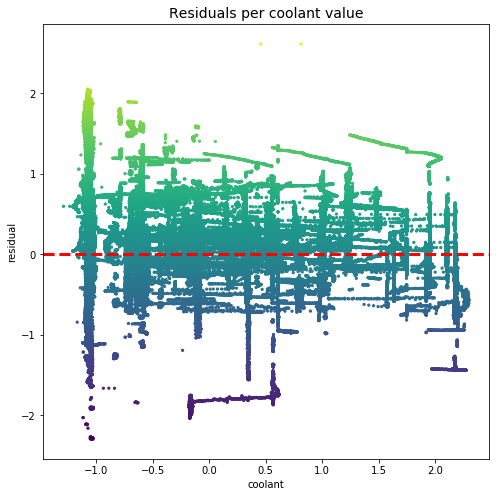

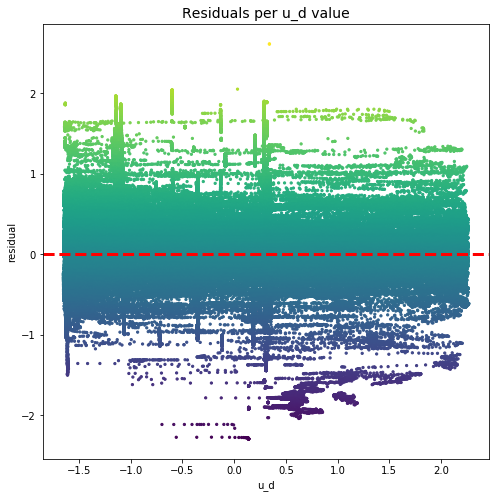

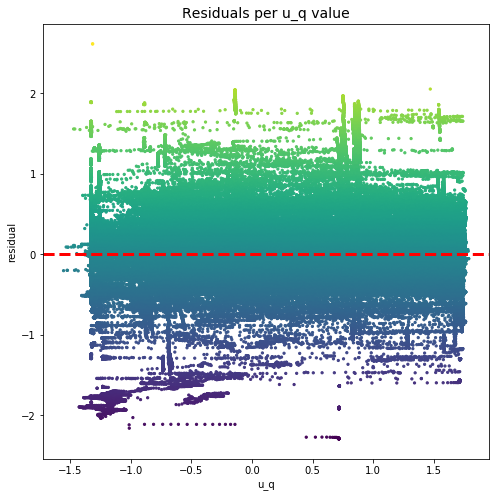

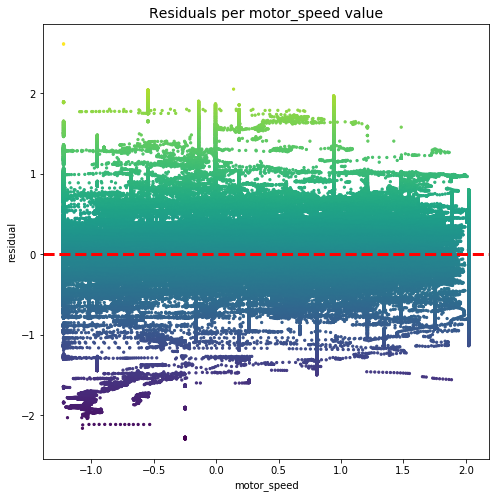

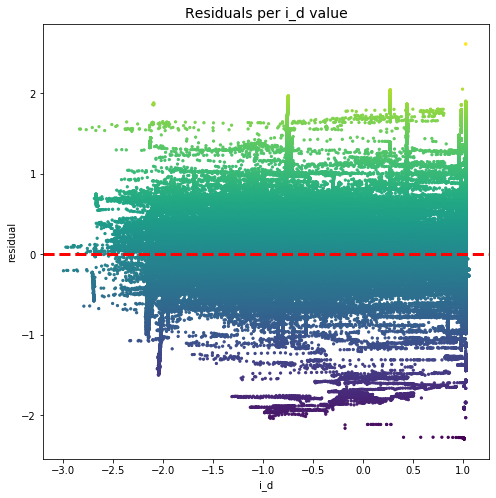

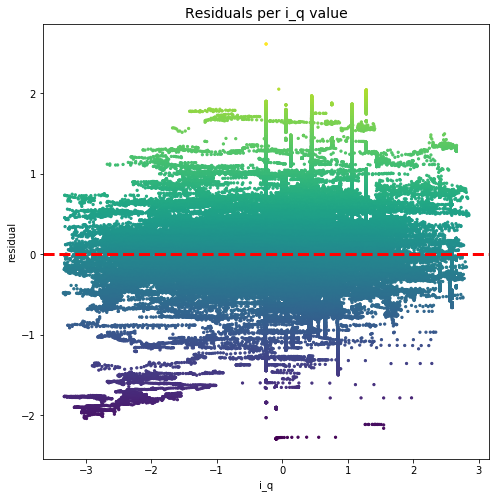

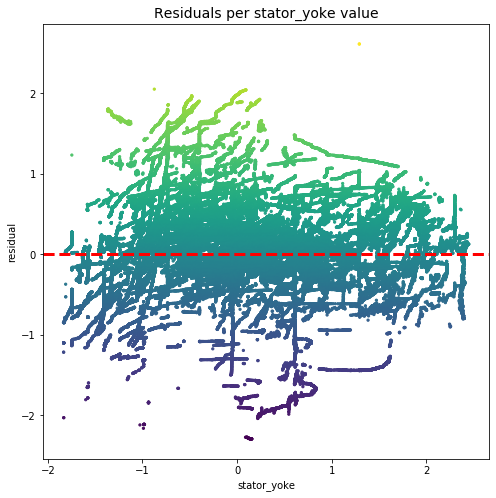

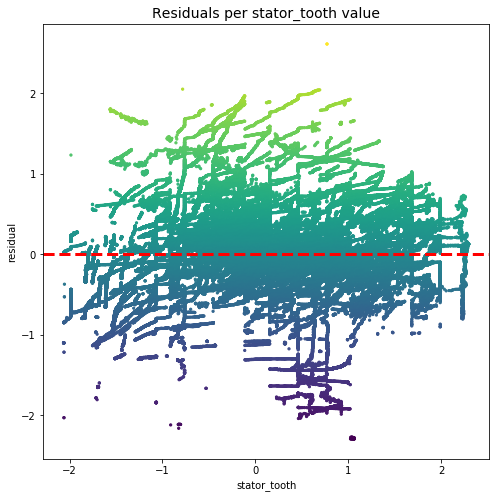

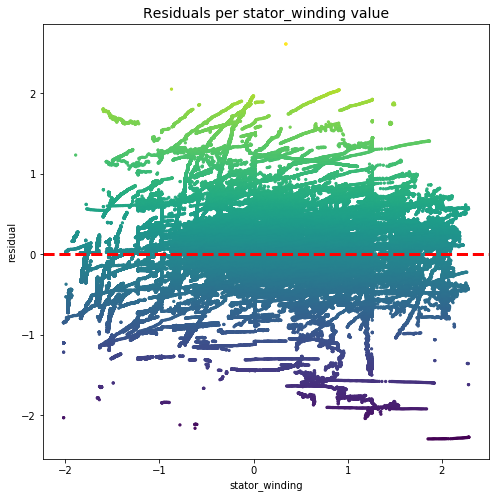

In [47]:
y_pred = tree_model.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### (7) Worst Predictions Analysis [Regression Tree]

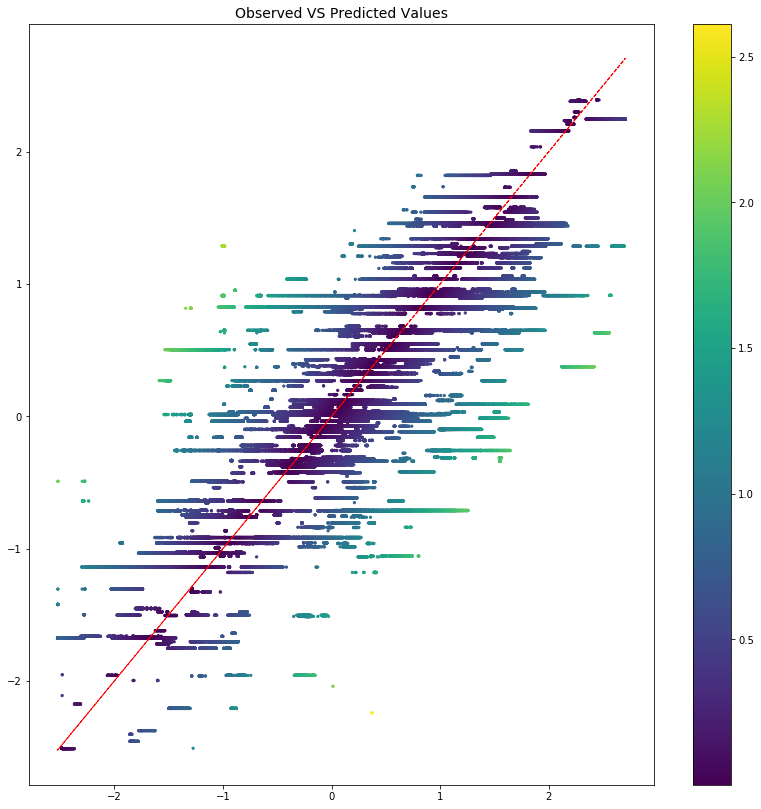

In [48]:
#Identify worsts predictions
def get_worst_pred(model, X, y):
    y_pred = model.predict(X)
    data = pd.DataFrame({'y_pred': y_pred}, index=X.index)
    data['y_truth'] = y
    data['abs_residual'] = (data.y_truth - data.y_pred).abs()

    data.sort_values(by=['abs_residual'], ascending=False, inplace=True)
    
    plt.figure(figsize=(14, 14))    
    plt.scatter(x=data.y_truth, y=data.y_pred, c=data.abs_residual, marker='o', s=5, cmap='viridis')
    plt.plot(data.y_truth, data.y_truth, c='r', ls='--', lw=1)
    plt.colorbar()
    plt.title('Observed VS Predicted Values', fontsize=14)
    plt.show()
    
    return data

df_worst_pred = get_worst_pred(tree_model, X_test, y_test)

In [49]:
df_worst_pred.head(10)

,y_pred,y_truth,abs_residual
898840,-2.242072,0.371321,2.613393
898841,-2.242072,0.370959,2.613031
280202,1.284695,-1.007156,2.291851
280200,1.284695,-1.006995,2.291690
280201,1.284695,-1.006879,2.291574
280199,1.284695,-1.006803,2.291497
280198,1.284695,-1.006218,2.290912
280195,1.284695,-1.006017,2.290712
280194,1.284695,-1.006012,2.290707
280193,1.284695,-1.005872,2.290567


**Check features for worst predicted points**

In [50]:
# Given the filter above (for 1 or 0 errors), show the worst offenders
index_to_debug = df_worst_pred.index
points_to_debug = X_test.loc[index_to_debug].head(10)
points_to_debug.style.background_gradient(cmap='summer', low=2).set_caption('For worsts errors, show the features we use')

,ambient,coolant,u_d,u_q,motor_speed,i_d,i_q,stator_yoke,stator_tooth,stator_winding
898840,-4.15586,0.456729,0.340317,-1.31491,-1.22243,1.02915,-0.245722,1.29207,0.772398,0.345244
898841,-2.81459,0.813498,0.341528,-1.31632,-1.22243,1.02914,-0.245717,1.29188,0.772158,0.340918
280202,-2.21368,-1.04438,0.139743,0.717409,-0.248462,1.01396,-0.0914355,0.154752,1.0257,1.85404
280200,-2.37609,-1.03583,0.139626,0.717431,-0.248462,1.01395,-0.0914362,0.154452,1.0341,1.88445
280201,-2.31826,-1.04025,0.139741,0.717447,-0.248463,1.01397,-0.091436,0.15469,1.03014,1.86915
280199,-2.32632,-1.03271,0.139609,0.717194,-0.248463,1.01395,-0.0914332,0.154298,1.03873,1.89841
280198,-2.34866,-1.03086,0.139656,0.717166,-0.248463,1.01395,-0.0914306,0.153263,1.04217,1.90955
280195,-2.4024,-1.0299,0.139689,0.717217,-0.248463,1.01395,-0.0914206,0.147793,1.0496,1.94709
280194,-2.41175,-1.03144,0.139684,0.717278,-0.248462,1.01395,-0.0914155,0.146515,1.05158,1.96232
280193,-2.3997,-1.03353,0.139664,0.717016,-0.248463,1.01394,-0.0914091,0.145436,1.05377,1.97566


**Example of debugging**

In [51]:
# Example of debugging
point_to_debug = X_test.loc[index_to_debug[0]]
print('Debugging:', point_to_debug, 
      'with scores:', df_worst_pred.loc[point_to_debug.name], 
      sep='\n\n')

Debugging:

ambient          -4.155861
coolant           0.456729
u_d               0.340317
u_q              -1.314911
motor_speed      -1.222434
i_d               1.029152
i_q              -0.245722
stator_yoke       1.292075
stator_tooth      0.772398
stator_winding    0.345244
Name: 898840, dtype: float64

with scores:

y_pred         -2.242072
y_truth         0.371321
abs_residual    2.613393
Name: 898840, dtype: float64


### (8) Model vs Dummy Classifier [Regression Tree]

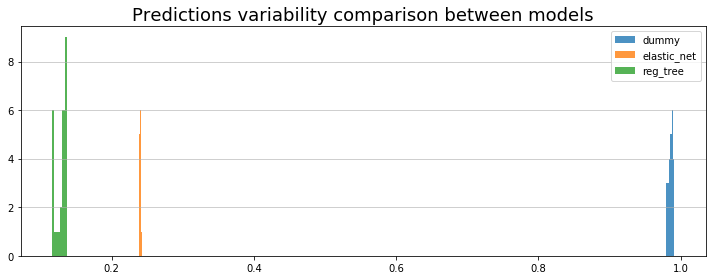

In [52]:
df_scores = pd.DataFrame(scores)


# Plot scores for every model
plt.figure(figsize=(10, 4))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

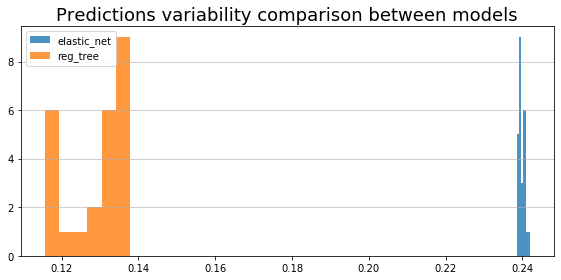

In [53]:
########################################
# Only Elastic Net and Regression Tree #
########################################

# Plot scores for every model
plt.figure(figsize=(8, 4))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.drop(columns=['dummy']).columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

### (9) Model Explanation [Regression Tree]

[Qui](https://github.com/ianozsvald/data_science_delivered/blob/master/ml_explain_regression_prediction.ipynb) per maggiori dettagli.

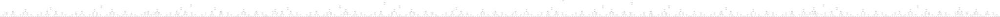

In [54]:
Source(export_graphviz(tree_model.best_estimator_, out_file=None, feature_names=X_train.columns))

In [55]:
for name, importance in zip(X_train.columns, tree_model.best_estimator_.feature_importances_):
    print('{:15s}\t:\t{:6.2%}'.format(name, importance))

ambient        	:	12.38%
coolant        	:	 6.23%
u_d            	:	 0.98%
u_q            	:	 2.92%
motor_speed    	:	 3.22%
i_d            	:	 3.70%
i_q            	:	 2.04%
stator_yoke    	:	 1.59%
stator_tooth   	:	65.44%
stator_winding 	:	 1.49%


# Ensemble Methods

I *metodi ensemble* sono meta-algoritmi in quanto combinano diversi modelli di machine learning in un unico modello predittivo allo scopo di migiorare le capacità predittive (**stacking**), ridurre la varianza (**bagging**) o diminuire il bias (**boosting**).

Gli ensemble possono essere distinti in

*   *sequenziali*, dove la previsione finale è ottenuta come sviluppo di previsioni intermedie fornite dagli algoritmi più semplici (**base learners**). Gli ensemble sequenziali sono sviluppati per poter sfruttare la dipendenza intrinseca tra i base learners, in cui il precedente migliora le performance del successivo. Un esempio di sequential ensembles sono i boosting algorithms in cui ad ogni datapoint è associato un peso che è determinato sulla base dell'errore che il modello ha prodotto prevedendo tale valore per la variabile target.
*   *paralleli*, in cui i base learners sono sviluppati parallelamente e, per quanto possibile, indipendentemente. L'idea è infatti di sfruttare l'indipendenza tra i modelli più semplici allo scopo di realizzare una previsione finale che è la media delle singole. Un esempio sono i bagging algorithms.

Gli ensemble possono essere classificati come

*   *omogenei*, in cui tutti i base learners utilizzati appartengono alla stessa famiglia di algoritmi;
*   *eterogenei*, in cui diversi modelli di machine learning sono combinati tra loro.

[Altre info](https://www.analyticsvidhya.com/blog/2018/06/comprehensive-guide-for-ensemble-models/)

## Stacked Algorithms

![Stacking](https://miro.medium.com/max/946/0*GHYCJIjkkrP5ZgPh.png)

Nello stacking ogni base learner è allenato distintamente su tutti i dati disponibili. Attraverso un sistema di voting le diverse previsioni sono combinate tra loro con dei pesi allo scopo di fornire la stima finale. Generalmente i pesi sono determinati sulla base della precisione raggiunta dai base learners.

Un esempio: [VotingRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingRegressor.html#sklearn.ensemble.VotingRegressor) con relativa [applicazione](https://towardsdatascience.com/ensemble-learning-using-scikit-learn-85c4531ff86a).

Una [libreria](https://mlens.readthedocs.io/en/0.1.x/source/mlens.ensemble/) per lo stacking di algoritmi. Per quanto riguarda sklearn, [qui](https://scikit-learn.org/dev/modules/generated/sklearn.ensemble.StackingRegressor.html) in versione dev.

![Stacking](https://miro.medium.com/max/562/0*GXMZ7SIXHyVzGCE_.)

## Bagging Algorithms

Il termine `bagging` deriva da "**boostrap aggregation**" cioè "aggregazione attraverso campionamento ripetuto con reimmissione". Lo scopo del bagging è quello di ridurre la varianza delle stime calcolando la media di molteplici previsioni. Per esempio se alleniamo $n$ alberi decisionali $f$ su diverse partizioni ($D_1, \dots, D_n$) del dataset $\mathcal{D}$ allora la previsione finale sarà
$$\hat{y} = f(\mathbf{x}) = \frac{1}{n} \sum_{i=1}^{n} f_i(\mathbf{x})$$
La previsione finale è quindi un'aggregazione delle stime prodotte di singoli *base learners*.
Il termine bootstrap sottolinea invece con quali dati sono allenati i singoli modelli base: campionamento ripetuto con reimmissione. Nel bagging per compiti di classificazione si usa la tecnica decisionale del "voting", per compiti di regressione si fa uso della media come mostrato poco sopra.

Esistono anche altri particolari metodi di partizionamento del dataset che nel gergo comune ricadono comunque tra le tecniche di bagging.

> "*When random subsets of the dataset are drawn as random subsets of the samples, then this algorithm is known as Pasting. If samples are drawn with replacement, then the method is known as Bagging. When random subsets of the dataset are drawn as random subsets of the features, then the method is known as Random Subspaces.*" \
Cit. sklearn.ensemble.BaggingRegressor documentation




![Bagging](https://miro.medium.com/max/1086/1*l16JAxJR5MJea12jut-FLQ.png)

In [0]:
from sklearn.ensemble import BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor

### Regression Tree Bagging

In [0]:
tree_bag = BaggingRegressor(base_estimator=DecisionTreeRegressor(),
                            n_estimators=10,
                            bootstrap=True,
                            bootstrap_features=False,
                            n_jobs=-1)

In [58]:
tree_bag.fit(X_train, y_train)

BaggingRegressor(base_estimator=DecisionTreeRegressor(criterion='mse',
                                                      max_depth=None,
                                                      max_features=None,
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      presort=False,
                                                      random_state=None,
                                                      splitter='best'),
                 bootstrap=True, bootstrap_features=False, max_features=1.0,
                 max_sample

In [59]:
# Test
print(f'Test R2 Score: {tree_bag.score(X_test, y_test):.1%}')

Test R2 Score: 74.5%


In [60]:
reg_report(tree_bag, X_test, y_test)

REGRESSION REPORT
MSE  : 0.2398
RMSE : 0.4897
MAE  : 0.3659
R2   : 74.51%
explained_variance: 0.7507


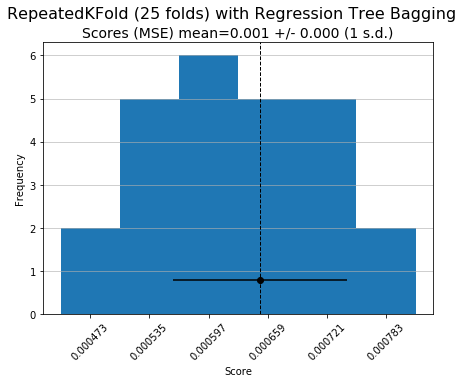

In [61]:
# Verify model stability
scores['tree_bag'] = cross_valid_report(tree_bag, X_test, y_test, model_type=f'Regression Tree Bagging')

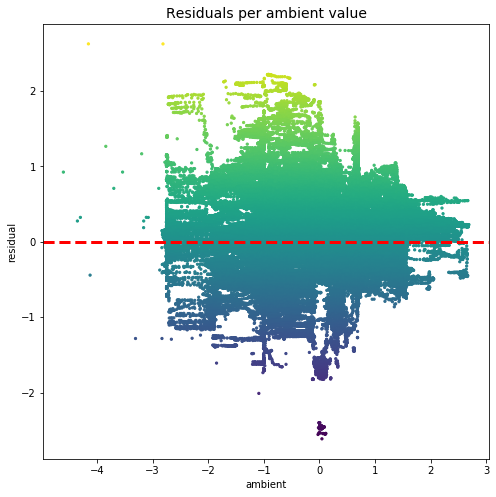

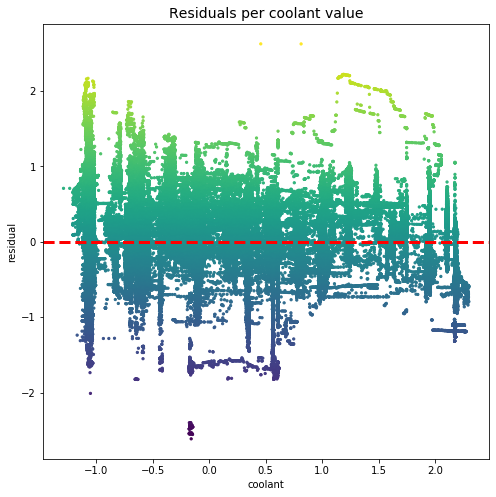

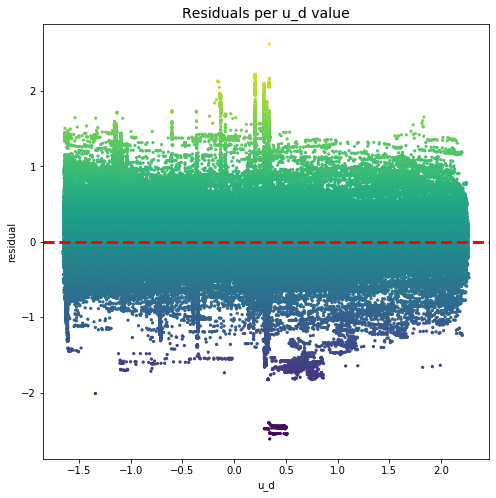

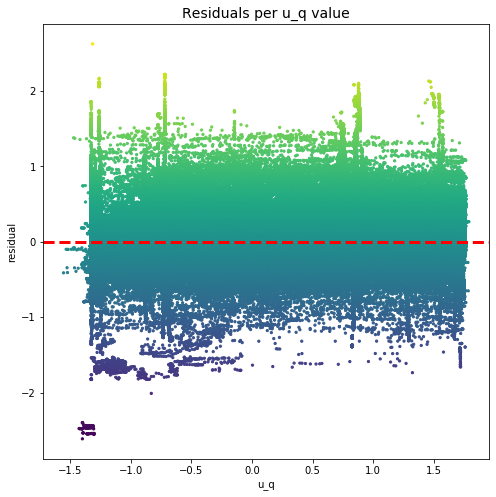

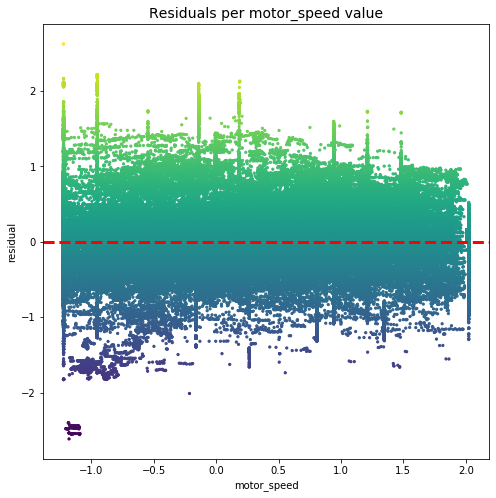

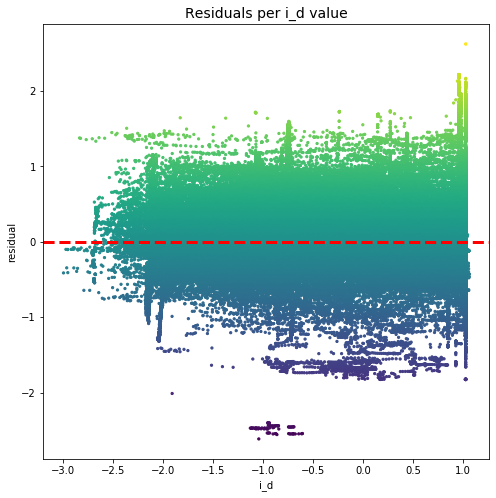

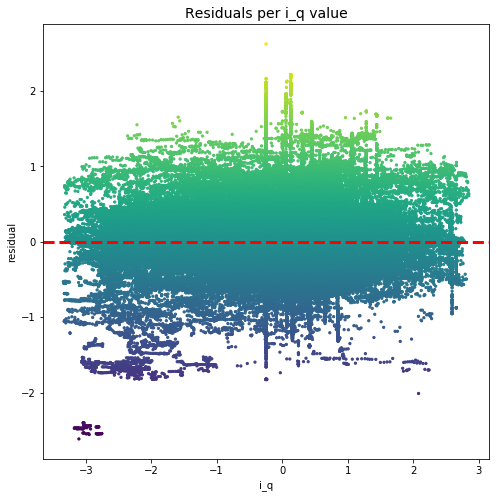

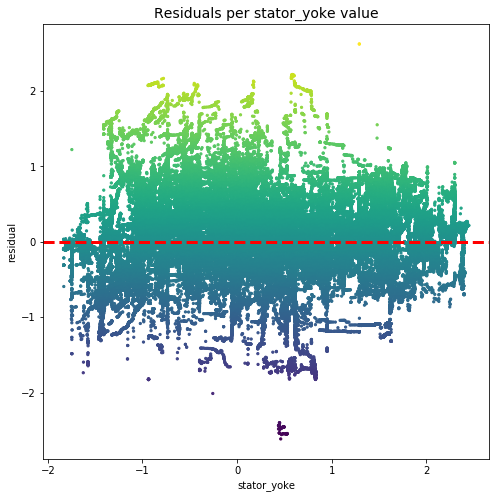

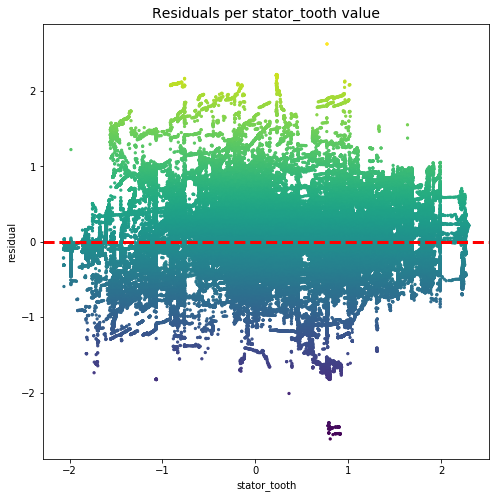

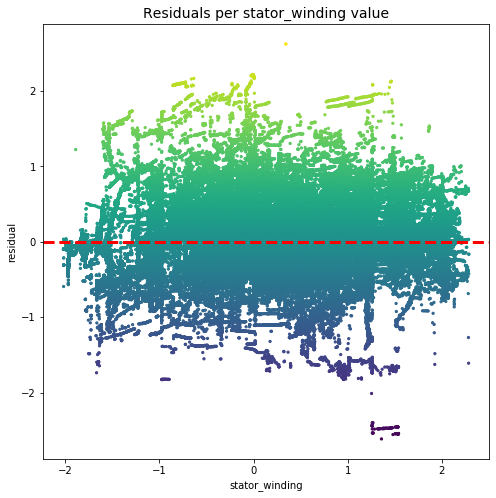

In [62]:
y_pred = tree_bag.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### k-Nearest Neighbour Bagging

In [0]:
knn_bag = BaggingRegressor(base_estimator=KNeighborsRegressor(),
                           n_estimators=10,
                           bootstrap=True,
                           bootstrap_features=False,
                           n_jobs=-1)

In [64]:
knn_bag.fit(X_train, y_train)

BaggingRegressor(base_estimator=KNeighborsRegressor(algorithm='auto',
                                                    leaf_size=30,
                                                    metric='minkowski',
                                                    metric_params=None,
                                                    n_jobs=None, n_neighbors=5,
                                                    p=2, weights='uniform'),
                 bootstrap=True, bootstrap_features=False, max_features=1.0,
                 max_samples=1.0, n_estimators=10, n_jobs=-1, oob_score=False,
                 random_state=None, verbose=0, warm_start=False)

In [65]:
# Test
print(f'Test R2 Score: {knn_bag.score(X_test, y_test):.1%}')

Test R2 Score: 66.0%


In [66]:
reg_report(knn_bag, X_test, y_test)

REGRESSION REPORT
MSE  : 0.3194
RMSE : 0.5652
MAE  : 0.4219
R2   : 66.04%
explained_variance: 0.6768


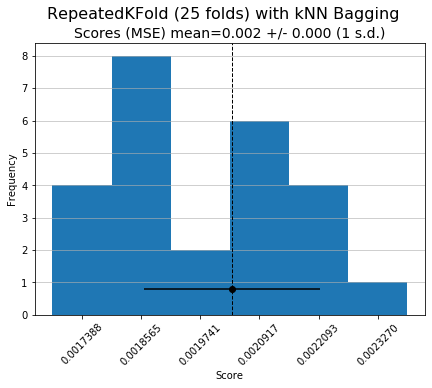

In [67]:
# Verify model stability
scores['knn_bag'] = cross_valid_report(knn_bag, X_test, y_test, model_type=f'kNN Bagging')

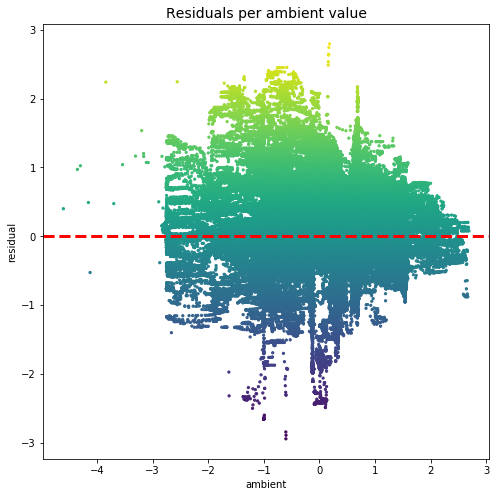

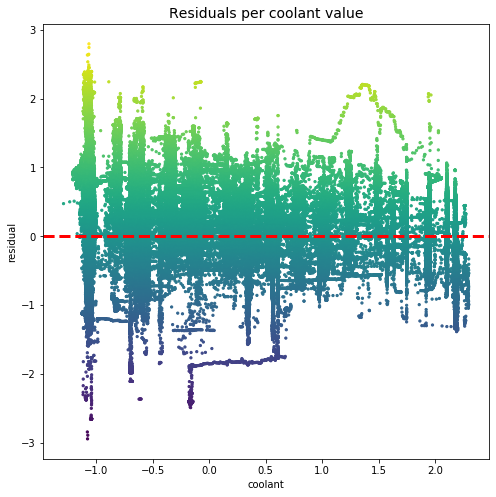

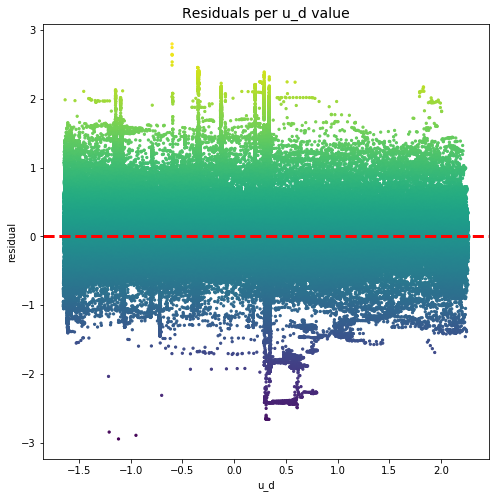

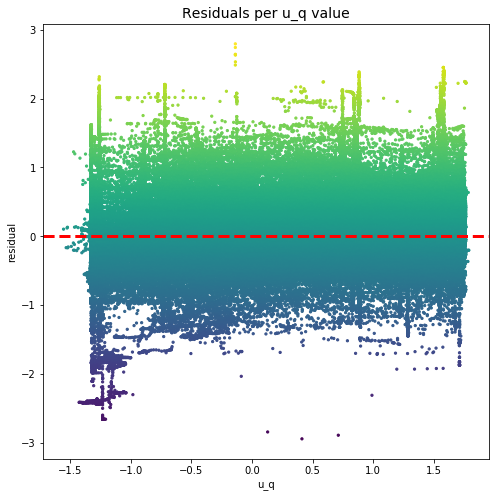

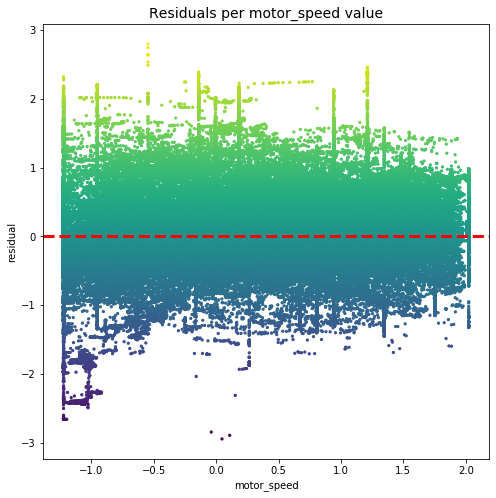

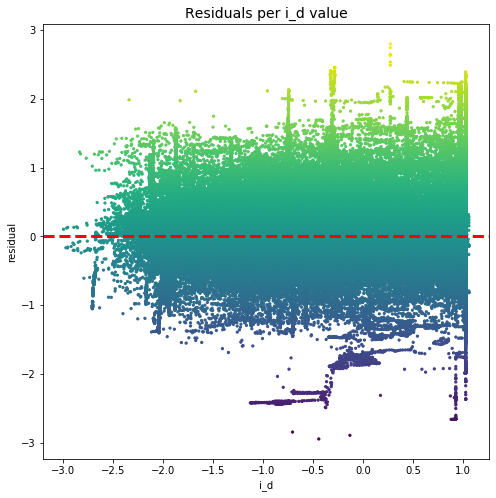

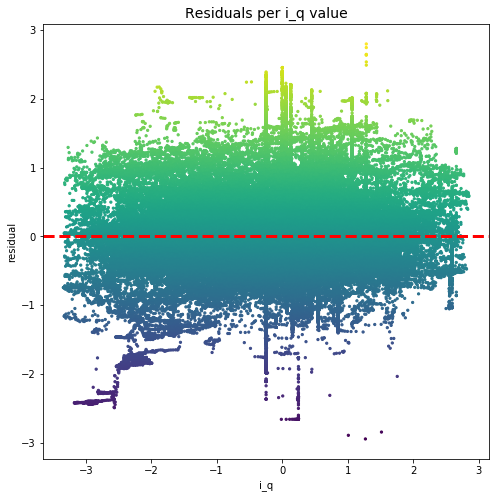

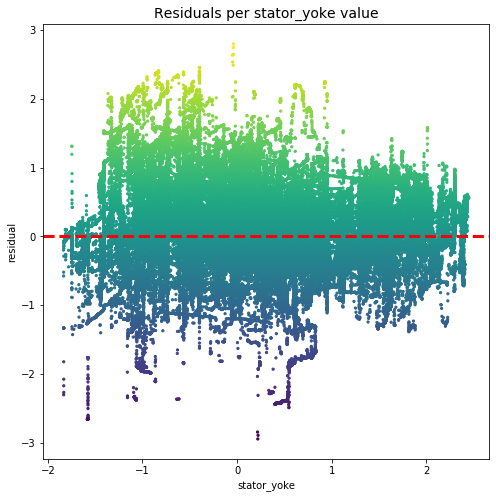

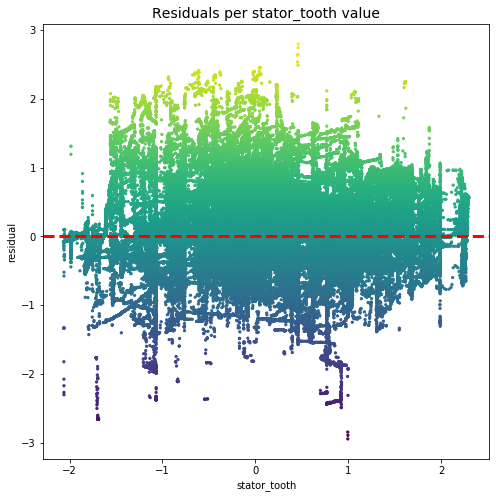

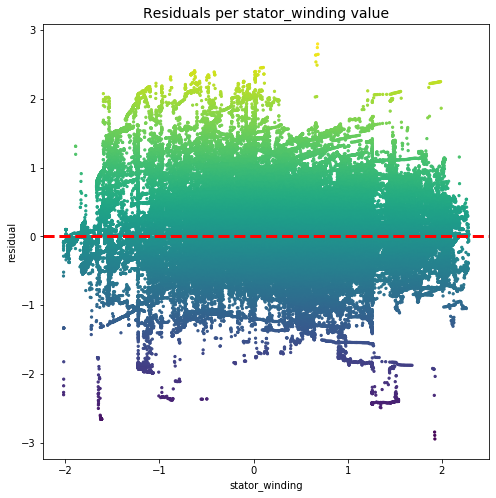

In [68]:
y_pred = knn_bag.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### Models Comparison

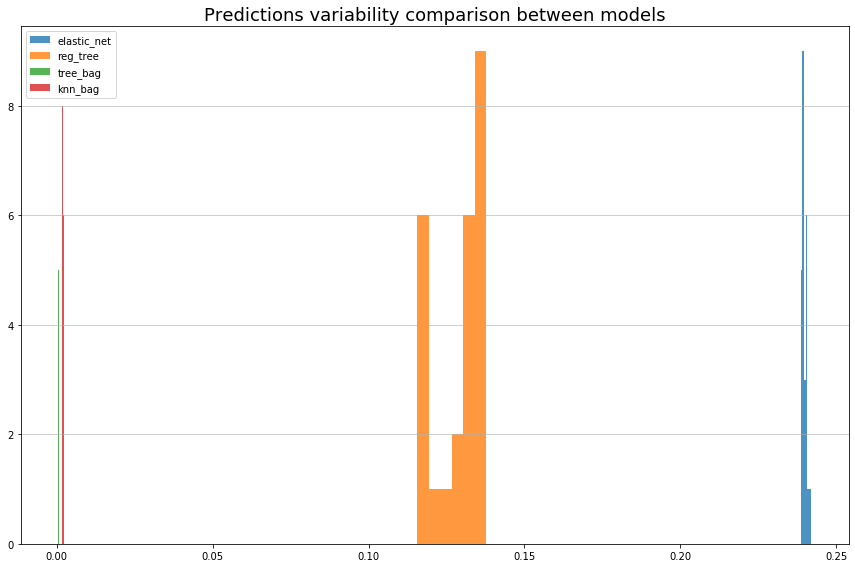

In [69]:
df_scores = pd.DataFrame(scores)


# Plot scores for every model
plt.figure(figsize=(12, 8))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.drop(columns=['dummy']).columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

Il modello prodotto tramite bagging di alberi decisionali produce previsioni migliori rispetto a quelle ottenute con base learner pari al kNN. Quest'ultimo tipo di modello risente infatti molto meno delle perturbazioni sui dati di training e per questo viene anche detto *stable learner*. Combinare stable learners è meno conveniente in quanto l'ensemble non permette di aumentare di molto la generalizzazione delle performance.

### Random Forest

![Random Forest](https://miro.medium.com/max/561/1*jEGFJCm4VSG0OzoqFUQJQg.jpeg)

"*Random forest is different from the vanilla bagging in just one way. It uses a modified tree learning algorithm that inspects, at each split in the learning process, a random subset of the features. We do so to avoid the correlation between the trees. Suppose that we have a very strong predictor in the data set along with a number of other moderately strong predictors, then in the collection of bagged trees, most or all of our decision trees will use the very strong predictor for the first split! All bagged trees will look similar. Hence all the predictions from the bagged trees will be highly correlated. Correlated
predictors cannot help in improving the accuracy of prediction.* 

**By taking a random subset of features, Random Forests systematically avoids correlation and improves model’s performance.**



![Random Forest](https://miro.medium.com/max/884/1*5vlUF8FRR6flPPWK4wt-Kw.png)

![Radnom Forest](https://miro.medium.com/max/988/0*uGzCQfXlC-97VR10.)

In [0]:
from sklearn.ensemble import RandomForestRegressor

In [0]:
random_forest = RandomForestRegressor(n_estimators=10,
                                      max_depth=None,
                                      bootstrap=True,
                                      n_jobs=-1)

In [72]:
random_forest.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)

In [73]:
# Test
print(f'Test R2 Score: {random_forest.score(X_test, y_test):.1%}')

Test R2 Score: 75.5%


In [74]:
reg_report(random_forest, X_test, y_test)

REGRESSION REPORT
MSE  : 0.2302
RMSE : 0.4797
MAE  : 0.3619
R2   : 75.53%
explained_variance: 0.7611


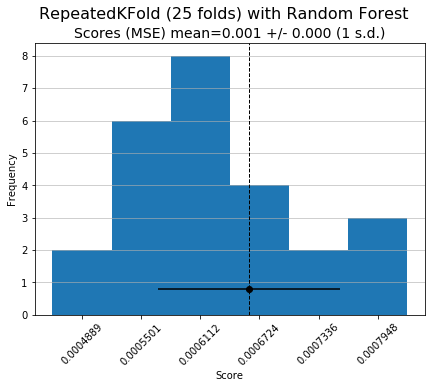

In [75]:
scores['random_forest'] = cross_valid_report(random_forest, X_test, y_test, model_type=f'Random Forest')

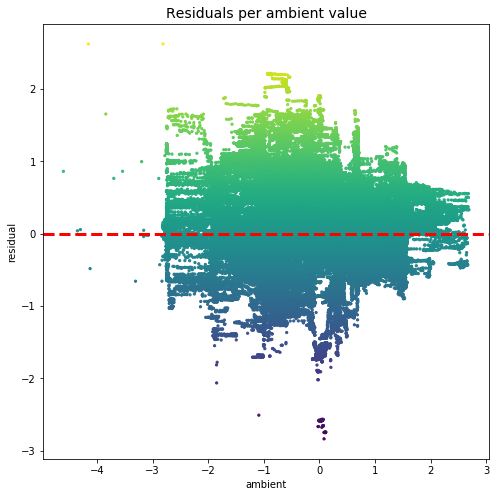

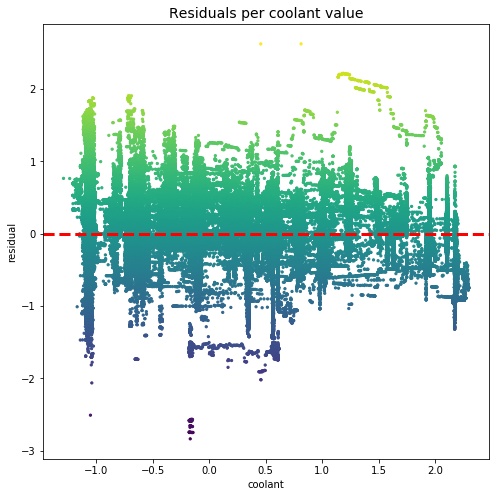

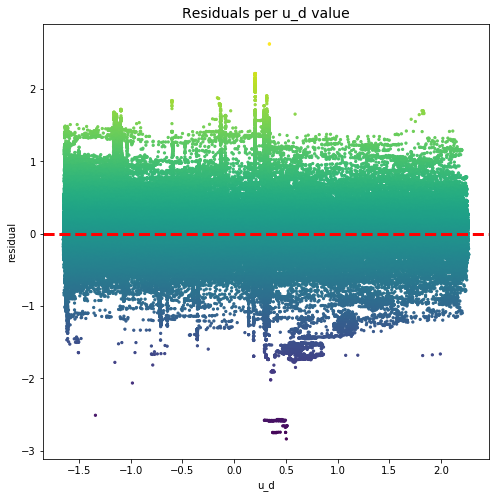

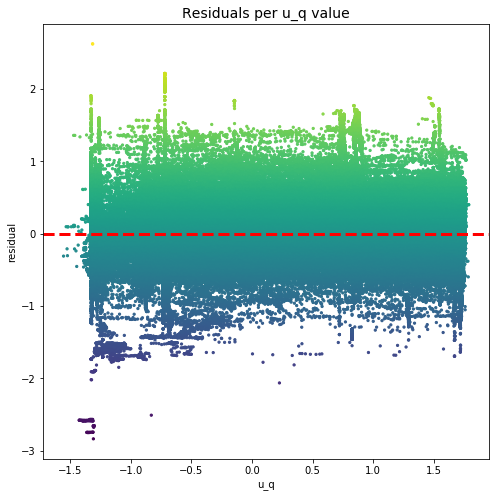

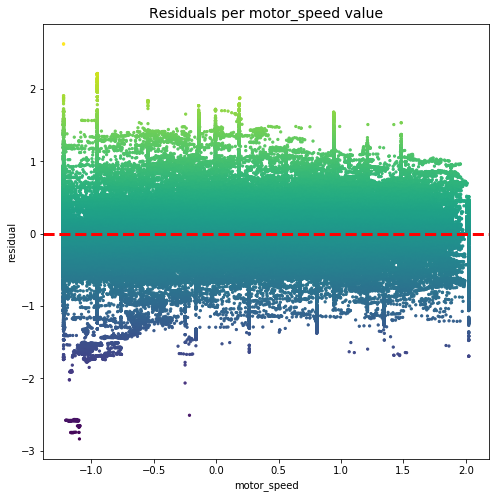

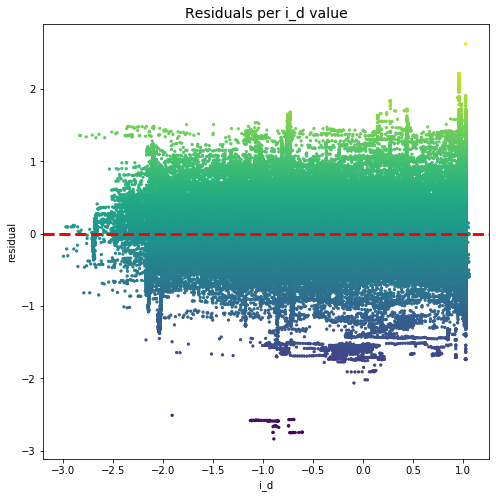

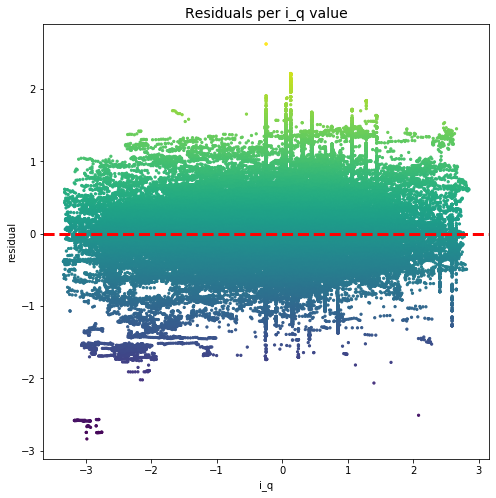

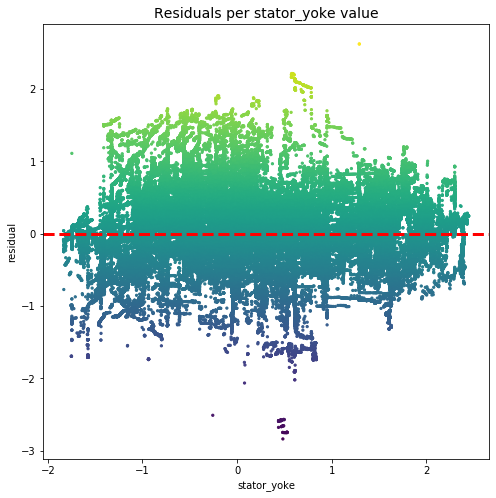

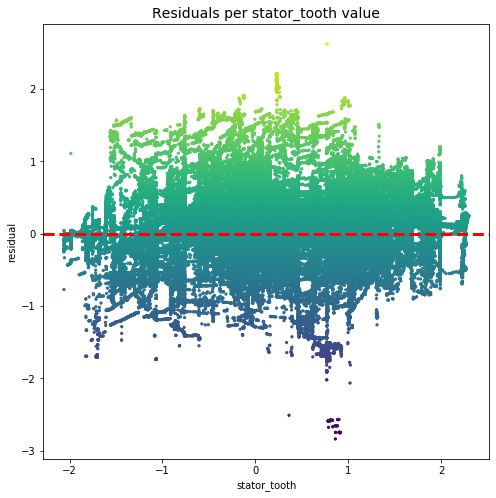

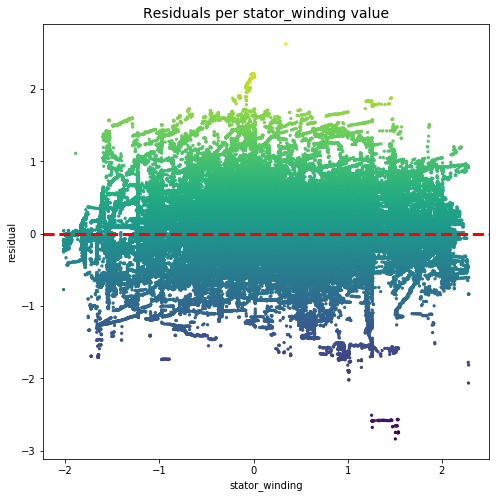

In [76]:
y_pred = random_forest.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

**Feature Importance**\
*One problem with computing fully grown trees is that we cannot easily interpret the results. And it is no longer clear which variables are important to the relationship. Calculating drop in the error function for a variable at each split point gives us an idea of feature importance. It means that we record the total amount that the error is decreased due to splits over a given predictor, averaged over all bagged trees. A large value then indicates an important predictor. In regression problems this may be the drop in residual sum of squares and in classification this might be the Gini score.*



### Models Comparison

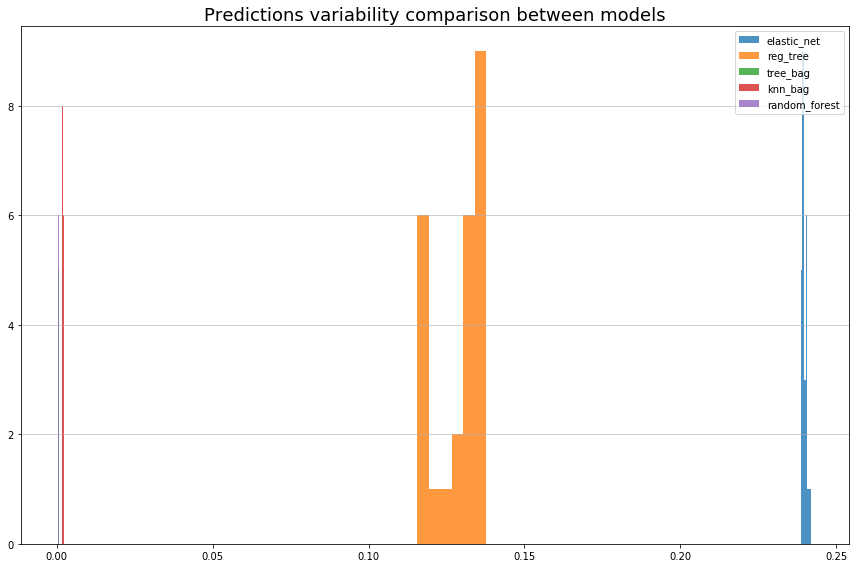

In [78]:
df_scores = pd.DataFrame(scores)


# Plot scores for every model
plt.figure(figsize=(12, 8))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.drop(columns=['dummy']).columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

Esistono algoritmi simili alle random forest ma ancora più mirati alla riduzione della varianza delle previsioni: è il caso degli **extremely randomized trees**. Anche in questo caso si parla di ensemble omogenei basati su alberi di decisione in cui però stavolta il criterio decisionale è scelto a caso in quanto il threshold stabilito per ogni variabile è randomico e tra queste possibilità è scelta quella che riduce maggiormente l'errore. L'utilizzo di questi ensemble permette di ridurre ulteriormente la varianza alle spese di un aumento del bias.

## Boosting Algorithms

Gli algoritmi di boosting hanno la particolarità di utilizzare come base learners i **weak learners**. Con questo termine si intendono modelli di machine learning in grado di produrre previsioni leggermente superiori a quelle di un dummy model (che le produce a caso, "random guessing"). Ne è un esempio l'albero decisionale nella sua forma più basica, con un solo nodo (il **decision stump**).

> Il boosting prevede la costruzione di un ensemble sequenziale basato su weak learners allo scopo di realizzare un unico **strong learner**.

Nel boosting le previsioni del modello precedente $f_i$ influenzano il dominio di allenamento di quello successivo $f_{i+1}$: ogni campione usato per allenare $f_{i+1}$ viene pesato sulla base dell'errore di previsione prodotto da $f_i$. Errori grandi implicano pesi elevati e viceversa.
> I weak learner sono quindi allenati in sequenza con una versione pesata dei dati.

Un esempio di algoritmo di boosting è [AdaBoost](https://en.wikipedia.org/wiki/AdaBoost), acronimo di "adaptive boosting".

Secondo la notazione usuale, il boosting model è definito come
$$\hat{y}_T(\mathbf{x}) = \sum_{t=1}^T f_t (\mathbf{x})$$
dove $f_t$ è funzione del weak learner.

Sia $h$ un generico weak learner e sia  $h(\mathbf{x}_i)$ la previsione da esso fornita sul punto $\mathbf{x}_i$.\
Allora definendo
$$f_t (\mathbf{x}_i) = \alpha_t h(\mathbf{x}_i)$$
si trova $h$ (o suoi parametri) tale che minimizzi la funzione di rischio allo step $t$.
$$\mathcal{R}_t = \frac{1}{N}\sum_{i=1}^{N} \mathcal{L}\left(y_i, \hat{y}_{t-1}(\mathbf{x}_i) + f_t (\mathbf{x}_i)\right)$$

$$\mathcal{R}_t = \frac{1}{N}\sum_{i=1}^{N} \mathcal{L}\left(y_i, \hat{y}_{t-1}(\mathbf{x}_i) + \alpha_t h(\mathbf{x}_i)\right)$$

Scegliendo un'opportuna loss function (ad esempio nel caso della classificazione si utilizza $\mathcal{L}=e^{-y\hat{y}}$), tale richiesta è equivalente a ricercare $h$ che minimizza la funzione
$$\mathcal{R}_t = \frac{1}{N} \sum_{i=1}^N \omega_{i, t} \mathcal{L}\left(y_i, h_t(\mathbf{x}_i)\right)$$
con
$$\omega_{i, t} = \mathcal{L}\left(y_i, \hat{y}_{t-1}(\mathbf{x}_i)\right)$$


[Qui](https://en.wikipedia.org/wiki/AdaBoost) per la dimostrazione completa.
![AdaBoost](https://miro.medium.com/max/753/0*MmYd6wgreP-oBoKi.)

In [0]:
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor

### Regression Tree Boosting

In [0]:
tree_boost = AdaBoostRegressor(DecisionTreeRegressor(max_depth=4),
                               n_estimators=50,
                               learning_rate=1.0,
                               loss='linear')

In [82]:
tree_boost.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(criterion='mse',
                                                       max_depth=4,
                                                       max_features=None,
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       presort=False,
                                                       random_state=None,
                                                       splitter='best'),
                  learning_rate=1.0, loss='linear', n_estimators=50,
                  random_s

In [83]:
# Test
print(f'Test R2 Score: {tree_boost.score(X_test, y_test):.1%}')

Test R2 Score: 70.6%


In [84]:
reg_report(tree_boost, X_test, y_test)

REGRESSION REPORT
MSE  : 0.2770
RMSE : 0.5263
MAE  : 0.4272
R2   : 70.55%
explained_variance: 0.7244


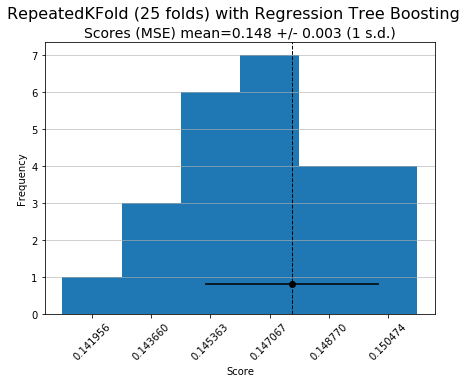

In [85]:
# Verify model stability
scores['tree_boost'] = cross_valid_report(tree_boost, X_test, y_test, model_type=f'Regression Tree Boosting')

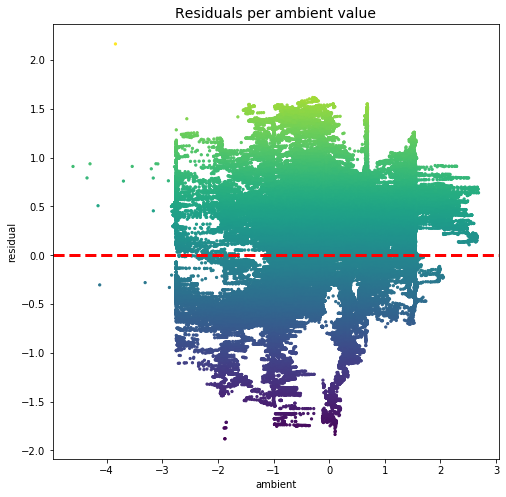

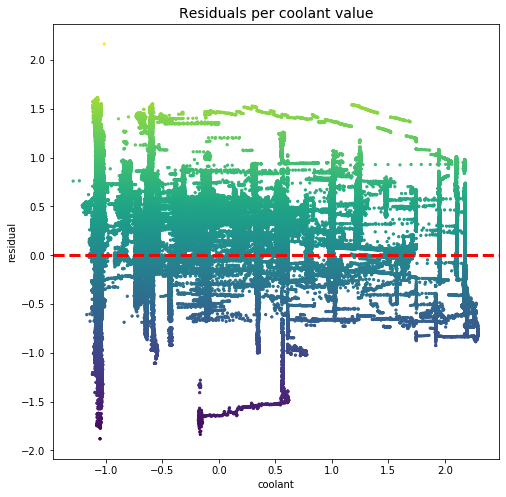

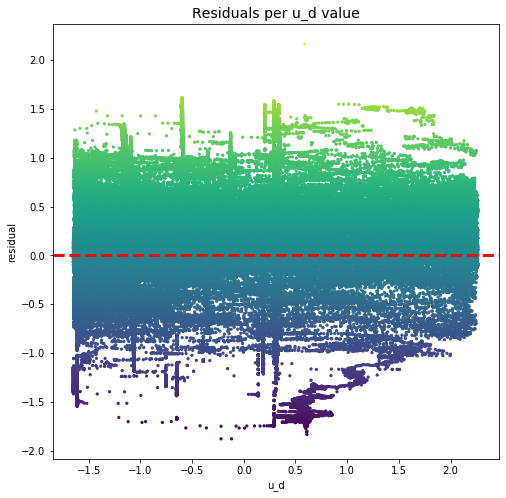

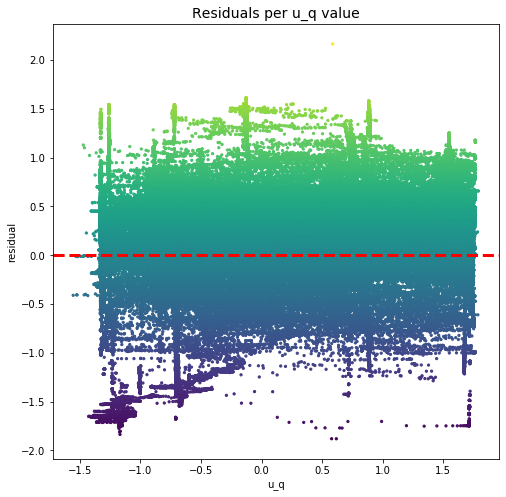

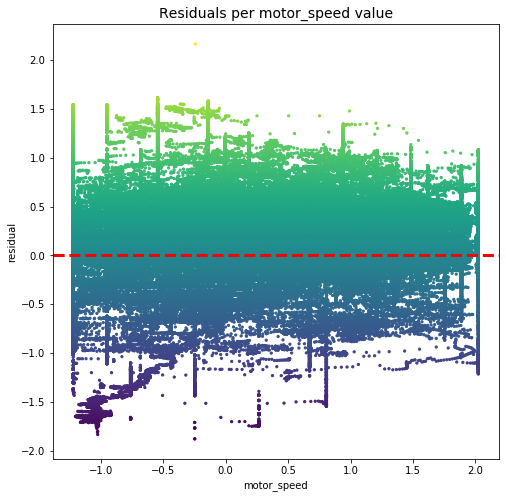

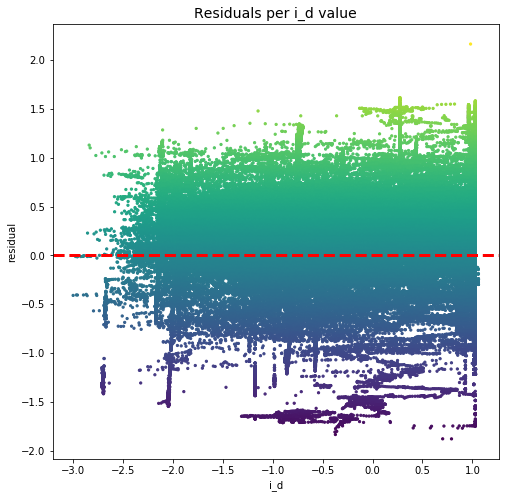

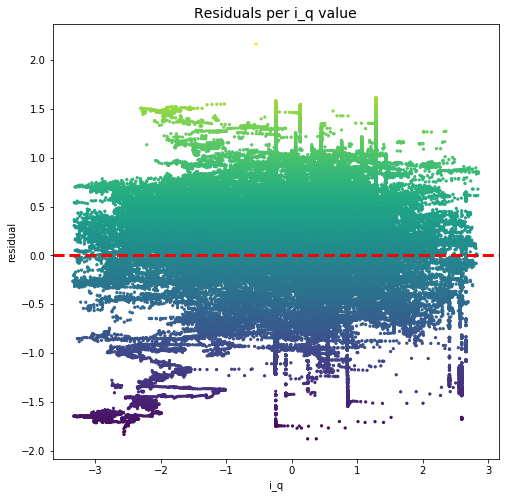

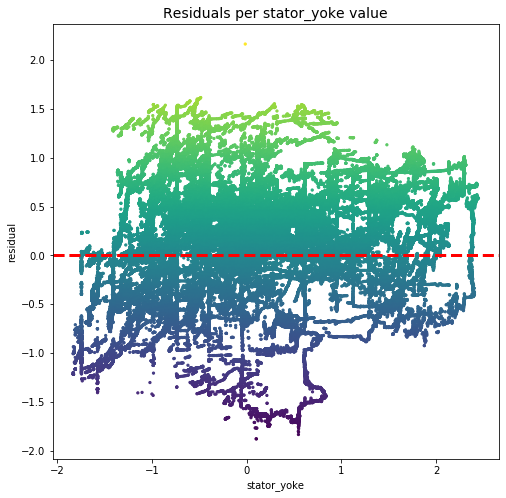

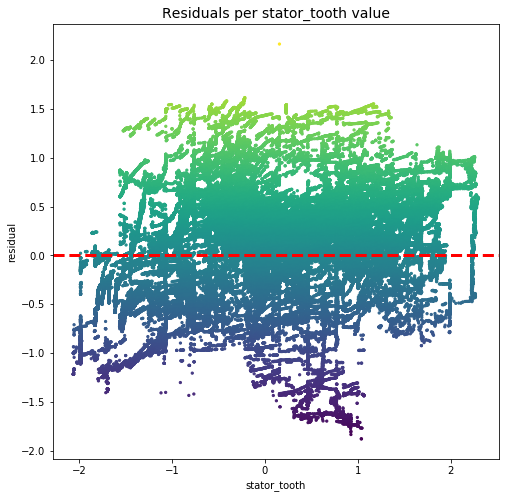

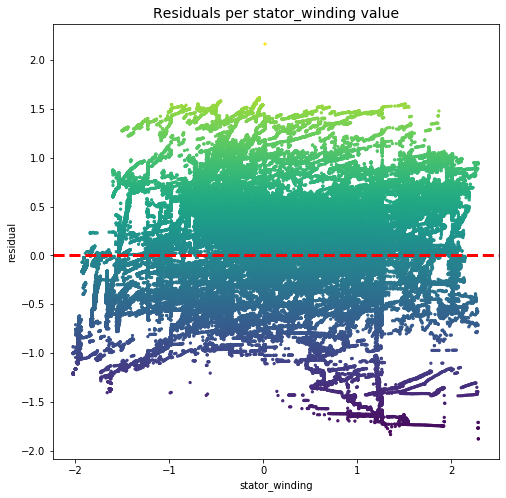

In [86]:
y_pred = tree_boost.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### XGBoost

Un algoritmo più complicato di boosting tramite CART.
[Qui](https://arxiv.org/pdf/1603.02754.pdf) la teoria, [qui](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html) la classe di riferimento di sklearn (se ne osservi il numero di iper-parametri).

In [0]:
xgboost = GradientBoostingRegressor(n_estimators=50)

In [88]:
xgboost.fit(X_train, y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [89]:
# Test
print(f'Test R2 Score: {xgboost.score(X_test, y_test):.1%}')

Test R2 Score: 73.6%


In [90]:
reg_report(xgboost, X_test, y_test)

REGRESSION REPORT
MSE  : 0.2482
RMSE : 0.4982
MAE  : 0.3803
R2   : 73.62%
explained_variance: 0.7503


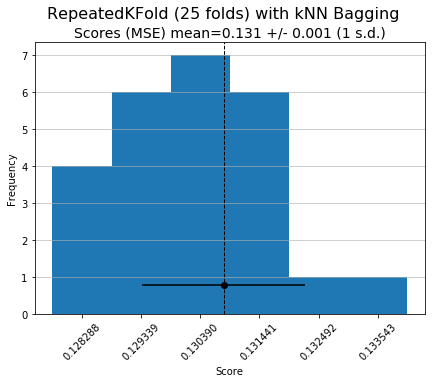

In [91]:
# Verify model stability
scores['xgboost'] = cross_valid_report(xgboost, X_test, y_test, model_type=f'kNN Bagging')

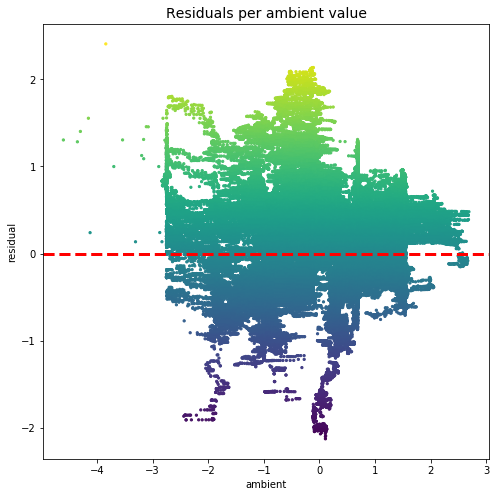

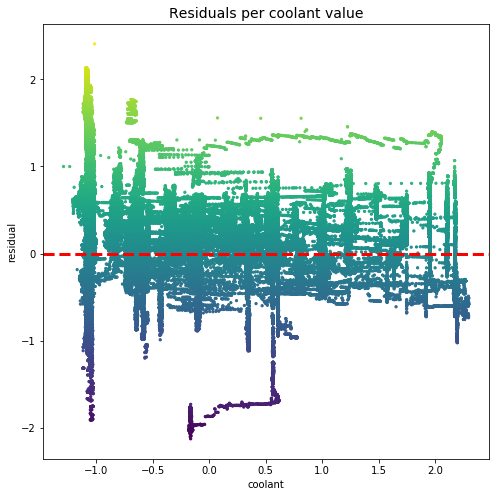

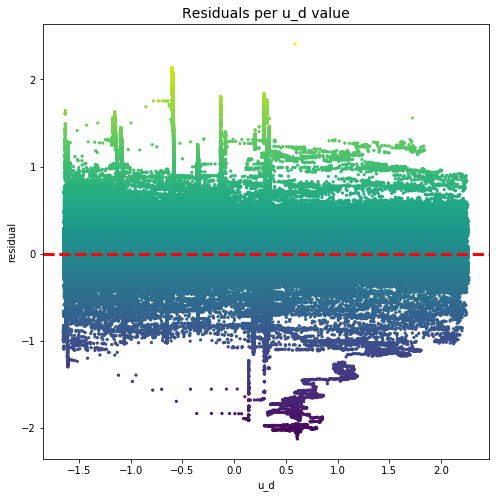

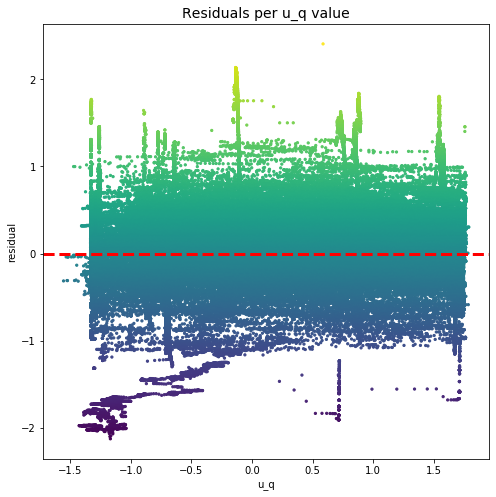

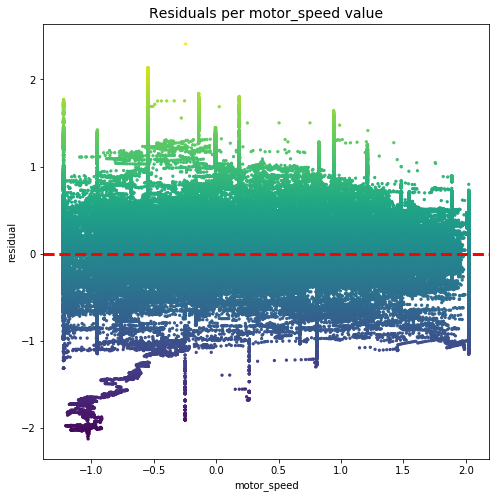

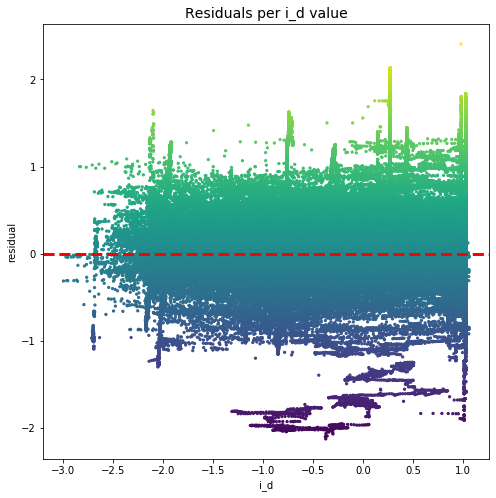

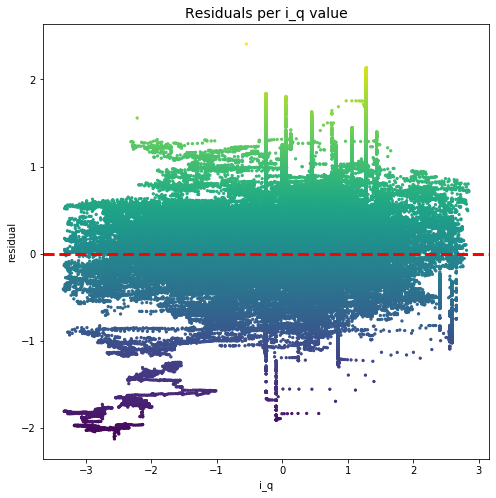

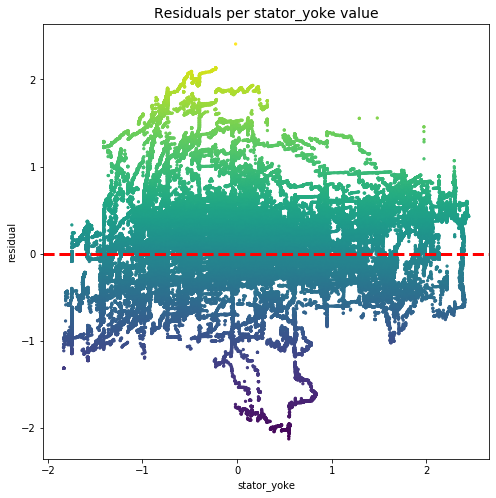

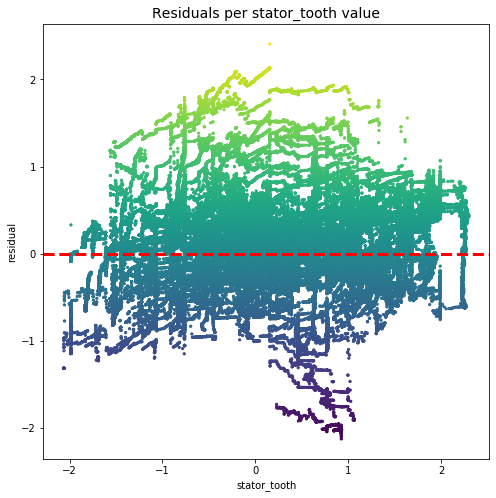

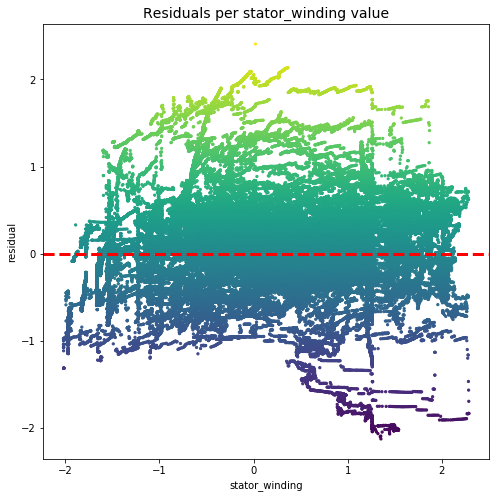

In [92]:
y_pred = xgboost.predict(X_test)

df_residuals = pd.DataFrame({'y_truth': y_test, 'y_pred': y_pred})
df_residuals['residuals'] = df_residuals.y_truth - df_residuals.y_pred

for col in X_test.columns:
    plt.figure(figsize=(8, 8))    
    plt.scatter(x=X_test[col], y=df_residuals.residuals, c=df_residuals.residuals, marker='o', s=5, cmap='viridis')
    plt.axhline(0, c='r', ls='--', lw=3)
    plt.xlabel(col)
    plt.ylabel('residual')
    plt.title(f'Residuals per {col} value', fontsize=14)
    plt.show()

### Models Comparison

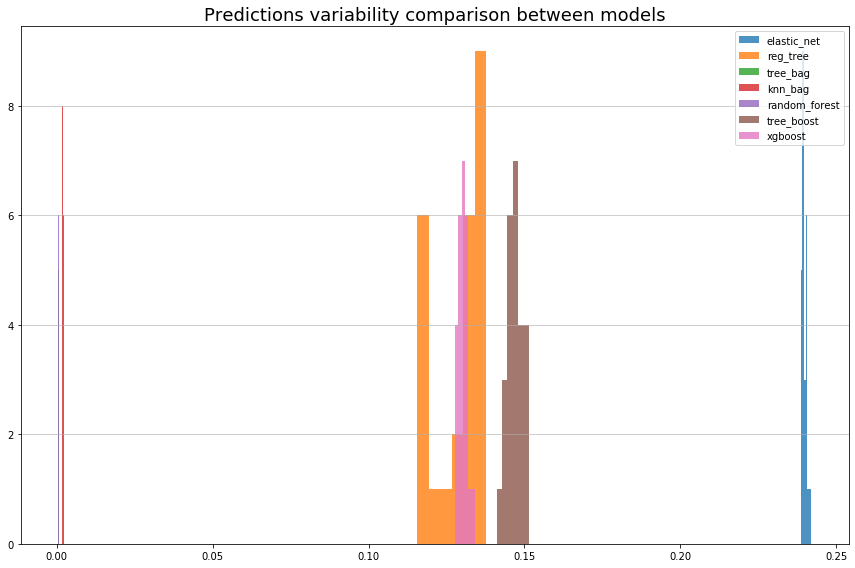

In [93]:
df_scores = pd.DataFrame(scores)


# Plot scores for every model
plt.figure(figsize=(12, 8))
colors = plt.rcParams["axes.prop_cycle"]()

# A subplot for every label
for i, col in enumerate(df_scores.drop(columns=['dummy']).columns):
    tmp = df_scores[col]

    # Histogram
    plt.hist(tmp, 
             bins='auto',
             align='left',
             label=f'{col}',
             color=next(colors)['color'], 
             alpha=0.8)

plt.grid(axis='y', alpha=0.75)
plt.title(f'Predictions variability comparison between models', fontsize=18)
plt.legend(loc='auto')
plt.tight_layout()
plt.show()

## (10) Esportazione dell'Algoritmo e Modello definitivo

In [94]:
from joblib import dump, load

# Save the model in local directory
dump(xgboost, 'model.joblib')

['model.joblib']

In [95]:
def predict_from_df(data, model_path='model'):
    model = load(f'{model_path}.joblib')
    # Could be used model.predict(data) on the entire DataFrame
    return data.apply(lambda x: model.predict(x.values.reshape(1, -1)), axis=1)

# Input Dataset: df without target variable
input_data = df.drop(columns=['pm', 'profile_id', 'time']).sample(20)
predict_from_df(input_data)

826085     [-0.4597700420485805]
695119    [-0.38730516059831177]
662879    [-0.31091127648611744]
367190      [0.9660875850723217]
659335     [0.12883932366114312]
387012     [-0.6598401511085817]
856378     [0.09373466466845104]
480953      [1.1545837486043604]
270530     [-1.9248272978095702]
46761       [1.1600967693195965]
506965      [0.4879719632989224]
112369     [-0.8326708297901517]
614844     [-1.5081066586829839]
92528      [-0.7764105118619391]
795259     [-0.7502189799332017]
60199     [-0.39514494817179185]
512217     [-1.5011426966438326]
761631    [-0.10924178888272668]
509116    [-0.45415924740365077]
657782      [1.1042387258961013]
dtype: object

## Esercizi


1. Utilizzare la funzione [`sklearn.preprocessing.PolynomialFeatures`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html) per produrre nuove variabili esplicative da utilizzare per lo sviluppo della regressione lineare.

2. Tramite analisi multivariata dei residui, individuare i motivi per i quali la regressione lineare ha dato pessimi risultati.

3.   > Mostrare come le previsioni dell'albero decisionale variano rispetto ad ogni variabile esplicativa (grafico $(x_i, \hat{y})$).

4. Imitare la costruzione di una random forest tramite la classe `sklearn.ensemble.BaggingRegressor`.

5.   > Verificare le performance di uno degli algoritmi utilizzati in corrispondenza dei picchi anomali della temperatura ambiente. 

## Fonti

> `"Python Data Science Handbook: Tools and Techniques for Developers"`, Jake VanderPlas

> `"Data Mining"`, Charu C. Aggarwal

> `"Outlier Analysis"`, Charu C. Aggarwal

> `"Pattern Recognition and Machine Learning"`, Christopher M. Bishop


# Completed Notebook

In [96]:
import datetime
print('Completed running this Notebook at:', datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S'))

Completed running this Notebook at: 2019-10-30 10:49:52
